## **Homework 2**
### Amir Ebrahimi
### **Student number**: 610701005

### **1.**
### 1.1. Pathbased dataset

In [2]:
# Imports
import pandas as pd
import numpy as np 
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

In [2]:
# Load data
file_path = "/Users/amirebrahimi/Documents/ML02-03/HW2/pathbased.txt"
df = pd.read_csv(file_path, delimiter = "\t", header=None)
df = df.rename(columns={0:"f1", 1:"f2", 2:"label"})
df.head()

,f1,f2,label
0,11.25,5.05,1
1,10.95,4.70,1
2,9.85,5.80,1
3,9.80,5.75,1
4,9.15,6.80,1


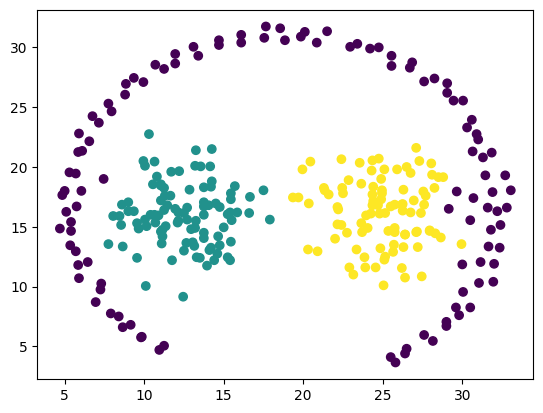

In [3]:
# Plot data
plt.scatter(df["f1"], df["f2"], c = df["label"])
plt.show()

In [4]:
X = df[["f1", "f2"]].values
y = df["label"].values
print(X.shape)
print(y.shape)

(300, 2)
(300,)


In [5]:
# Z-score normalization of feature vectors
from scipy import stats

X = stats.zscore(X)
print(X[:5])

[[-0.92196455 -2.07630988]
 [-0.95837465 -2.13617794]
 [-1.09187837 -1.94802117]
 [-1.09794672 -1.95657375]
 [-1.17683529 -1.77696957]]


#### Kmeans clustering

In [6]:
km = KMeans(n_clusters=3,  # As dataset suggests
            init="k-means++",
            n_init=10,
            max_iter=300,
            tol=1e-4,
            random_state=0)

y_km = km.fit_predict(X)

In this K-means implementation, the number of clusters was set to 3 and the cluster centers were initialized by the ```kmeans++``` extension of the original k-means algorithm for better convergence. Specifically, this extension selects the centroids by a weighted sampling function in each iteration whereas the original kmeans considers fixed values as centroids. 

Also, ```n_init``` was set to 10 which simply shows the number of times that kmeans initializes the centroids. ```max_iter``` was set to 300 which shows the maximum iterations in each intialization. Then, ```.fit_predict``` method was used to predict the cluster centroids.

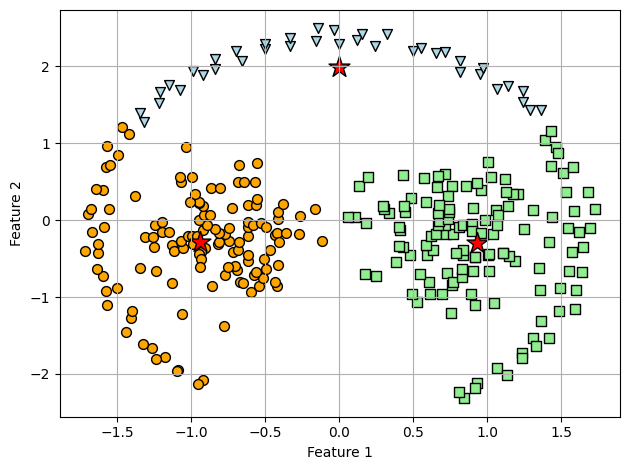

In [7]:
# Show clusters
plt.scatter(X[y_km == 0, 0],
            X[y_km == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_km == 1, 0],
            X[y_km == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.scatter(X[y_km == 2, 0],
            X[y_km == 2, 1],
            s=50,
            c="lightblue",
            marker="v",
            edgecolor="black",
            label="cluster 3")
plt.scatter(km.cluster_centers_[:, 0],
            km.cluster_centers_[:, 1],
            s=250, marker="*", c= "red", 
            edgecolor="black", label="Centroids")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Hierarchical clustering (average linkage)

In [8]:
from sklearn.cluster import AgglomerativeClustering

agg_avg = AgglomerativeClustering(n_clusters=3,
                                 metric="euclidean",
                                 linkage="average")
y_agg_avg = agg_avg.fit_predict(X)

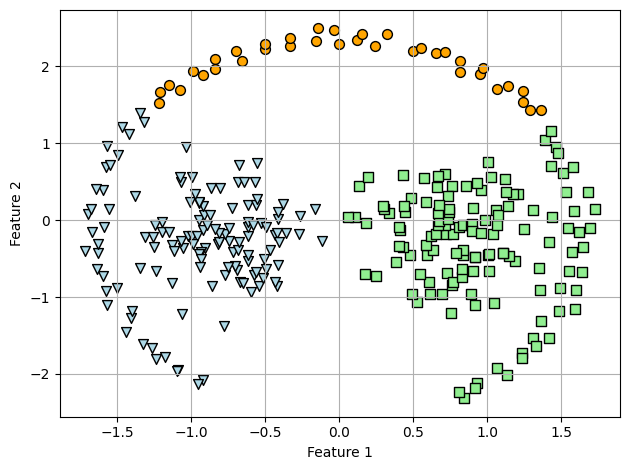

In [9]:
# Show clusters
plt.scatter(X[y_agg_avg == 0, 0],
            X[y_agg_avg == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_agg_avg == 1, 0],
            X[y_agg_avg == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.scatter(X[y_agg_avg == 2, 0],
            X[y_agg_avg == 2, 1],
            s=50,
            c="lightblue",
            marker="v",
            edgecolor="black",
            label="cluster 3")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

For average linkage hierarchical clustering, the following similarity measure was used:

$$
d(u,v)\;=\;\sum_{ij}\frac{d(u[i],v[j])}{(|u||v|)}
$$

Where $d(\,.)$ is the euclidean distance that was computed between the item $i$ and item $j$ of the clusters $u$ and $v$, respectively. Also, $|\,.|$ shows the size of a cluster.

#### Hierarchical clustering (single linkage)

In [10]:
agg_single = AgglomerativeClustering(n_clusters=3,
                                 metric="euclidean",
                                 linkage="single")
y_agg_single = agg_single.fit_predict(X)

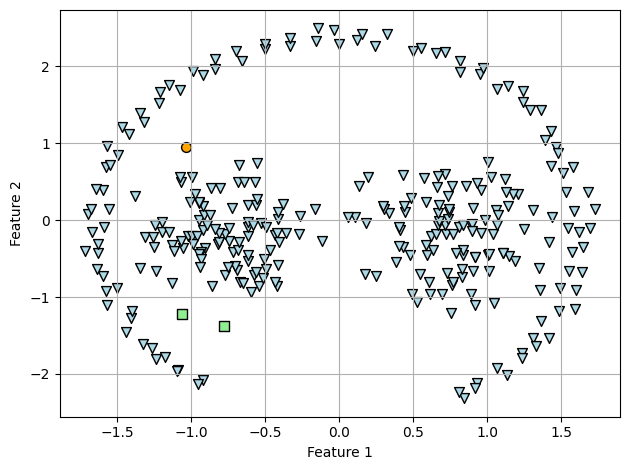

In [11]:
# Show clusters
plt.scatter(X[y_agg_single == 0, 0],
            X[y_agg_single == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_agg_single == 1, 0],
            X[y_agg_single == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.scatter(X[y_agg_single == 2, 0],
            X[y_agg_single == 2, 1],
            s=50,
            c="lightblue",
            marker="v",
            edgecolor="black",
            label="cluster 3")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

For single linkage hierarchical clustering, the following similarity measure was used:

$$
d(u,v) = min(dist(u[i], v[i]))
$$

Where $d(\,.)$ is the euclidean distance. This simply computes the distance between the most similar items in clusters and merges the clusters which have the minimum distance between the most similar items.

#### Hierarchical clustering (complete linkage)

In [12]:
agg_comp = AgglomerativeClustering(n_clusters=3,
                                 metric="euclidean",
                                 linkage="complete")
y_agg_comp = agg_comp.fit_predict(X)

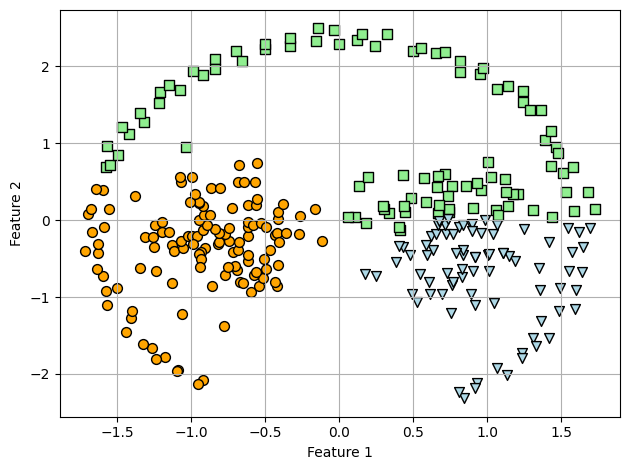

In [13]:
# Show clusters
plt.scatter(X[y_agg_comp == 0, 0],
            X[y_agg_comp == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_agg_comp == 1, 0],
            X[y_agg_comp == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.scatter(X[y_agg_comp == 2, 0],
            X[y_agg_comp == 2, 1],
            s=50,
            c="lightblue",
            marker="v",
            edgecolor="black",
            label="cluster 3")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Spectral clustering

In [14]:
from sklearn.cluster import SpectralClustering

spc = SpectralClustering(n_clusters=3, affinity="nearest_neighbors",
                         assign_labels="discretize",
                         random_state=0)
y_spc = spc.fit_predict(X)

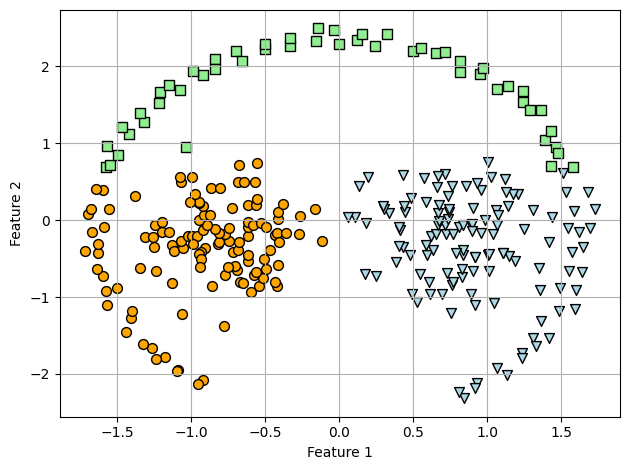

In [15]:
# Show clusters
plt.scatter(X[y_spc == 0, 0],
            X[y_spc == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_spc == 1, 0],
            X[y_spc == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.scatter(X[y_spc == 2, 0],
            X[y_spc == 2, 1],
            s=50,
            c="lightblue",
            marker="v",
            edgecolor="black",
            label="cluster 3")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

Here, the ```nearest_neighbors``` option was used for creating the similarity graph. It simply considers the ```k=10``` nearest neighbors of each data point and connects them in terms of a graph. So, the algorithm tries to separate these graphs from each other.

#### Purity index evaluation

In [16]:
from sklearn.metrics import confusion_matrix

def purity(true_lbls, pred_lbls):
    """
    Compute purity index for a clustering algorithm
    
    Args:
        true_lbls(numpy.ndarray): True labels
        pred_lbls(numpy.ndarray): Labels predicted by the algorithm
        
    Returns:
        float: purity_idx
    """
    contingency_matrix = confusion_matrix(true_lbls, pred_lbls)
    return np.sum(np.amax(contingency_matrix, axis=0))/np.sum(contingency_matrix)

In [17]:
km_purity = purity(y, y_km)
print(f"Kmeans purity: {km_purity:.4f}")

agg_avg_purity = purity(y, y_agg_avg)
print(f"Hierarchical clustering by average linkage purity: {agg_avg_purity:.4f}")

agg_single_purity = purity(y, y_agg_single)
print(f"Hierarchical clustering by single linkage purity: {agg_single_purity:.4f}")

agg_comp_purity = purity(y, y_agg_comp)
print(f"Hierarchical clustering by complete linkage purity: {agg_comp_purity:.4f}")

spec_purity = purity(y, y_spc)
print(f"Spectral clustering purity: {spec_purity:.4f}")

Kmeans purity: 0.7600
Hierarchical clustering by average linkage purity: 0.7533
Hierarchical clustering by single linkage purity: 0.3767
Hierarchical clustering by complete linkage purity: 0.6933
Spectral clustering purity: 0.7967


#### Rand index evaluation

In [18]:
from sklearn.metrics import adjusted_rand_score

rand_idx_mat = np.zeros((5, 5))
lbls = [y_km, y_agg_avg, y_agg_single, y_agg_comp, y_spc]

for i, lbl_i in enumerate(lbls):
    for j, lbl_j in enumerate(lbls):
        rand_idx_mat[i, j] = adjusted_rand_score(lbl_i, lbl_j)

print(rand_idx_mat)

[[ 1.          0.98454594 -0.00222076  0.63921966  0.89852753]
 [ 0.98454594  1.         -0.00240448  0.62576596  0.88446328]
 [-0.00222076 -0.00240448  1.         -0.00220787  0.00283009]
 [ 0.63921966  0.62576596 -0.00220787  1.          0.71153649]
 [ 0.89852753  0.88446328  0.00283009  0.71153649  1.        ]]


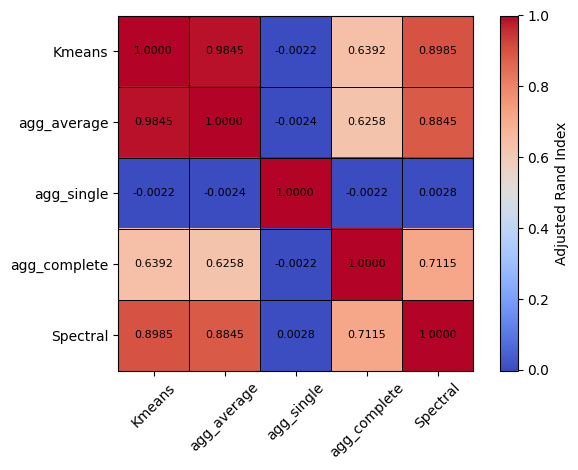

In [19]:
algo_lbls = ["Kmeans", "agg_average", "agg_single", "agg_complete", "Spectral"]
fig, ax = plt.subplots()  
im = ax.imshow(rand_idx_mat, cmap='coolwarm') 
colorbar = plt.colorbar(im, label='Adjusted Rand Index')
ax.set_xticks(range(len(algo_lbls)))
ax.set_yticks(range(len(algo_lbls)))
ax.set_xticklabels(algo_lbls, rotation=45)
ax.set_yticklabels(algo_lbls)
plt.tight_layout()
for i in range(len(algo_lbls)):
    for j in range(len(algo_lbls)):
        ax.axhline(y=i-0.5, color='black', linewidth=0.5)
        ax.axvline(x=j-0.5, color='black', linewidth=0.5)
        ax.text(j, i, f"{rand_idx_mat[i, j]:.4f}", ha='center', va='center', fontsize=8)

plt.show()

In this dataset, all algorithms performed simialrly except hierarchical clustering with single linkage which performed the worst in identifying the clusters.

**For all other datasets, the same strategies are used for clustering.**

### 1.2. Spiral dataset

In [20]:
# Load data
file_path = "/Users/amirebrahimi/Documents/ML02-03/HW2/spiral.txt"
df = pd.read_csv(file_path, delimiter = "\t", header=None)
df = df.rename(columns={0:"f1", 1:"f2", 2:"label"})
df.head()

,f1,f2,label
0,31.95,7.95,3
1,31.15,7.30,3
2,30.45,6.65,3
3,29.70,6.00,3
4,28.90,5.55,3


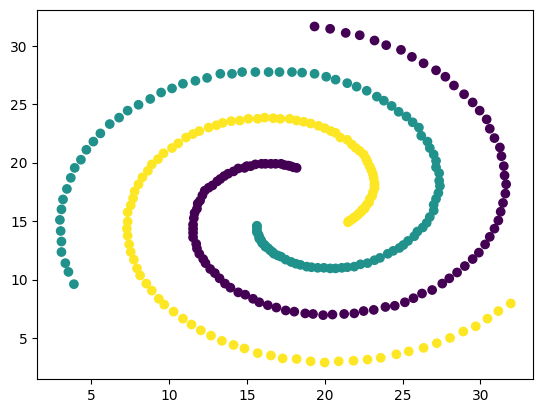

In [21]:
# Plot data
plt.scatter(df["f1"], df["f2"], c = df["label"])
plt.show()

In [22]:
X = df[["f1", "f2"]].values
y = df["label"].values
print(X.shape)
print(y.shape)

(312, 2)
(312,)


In [23]:
np.unique(y)

array([1, 2, 3])

In [24]:
# Z-score normalization of feature vectors
from scipy import stats

X = stats.zscore(X)
print(X[:5])

[[ 1.8580443  -1.22439397]
 [ 1.74827806 -1.31919843]
 [ 1.6522326  -1.41400289]
 [ 1.54932675 -1.50880734]
 [ 1.43956051 -1.5744412 ]]


#### Kmeans clustering

In [25]:
km = KMeans(n_clusters=3,  # As dataset suggests
            init="k-means++",
            n_init=10,
            max_iter=300,
            tol=1e-4,
            random_state=0)

y_km = km.fit_predict(X)

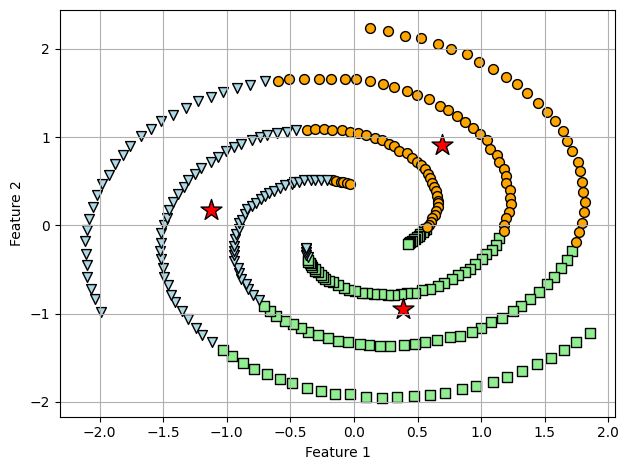

In [26]:
# Show clusters
plt.scatter(X[y_km == 0, 0],
            X[y_km == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_km == 1, 0],
            X[y_km == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.scatter(X[y_km == 2, 0],
            X[y_km == 2, 1],
            s=50,
            c="lightblue",
            marker="v",
            edgecolor="black",
            label="cluster 3")
plt.scatter(km.cluster_centers_[:, 0],
            km.cluster_centers_[:, 1],
            s=250, marker="*", c= "red", 
            edgecolor="black", label="Centroids")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Hierarchical clustering(average linkage)

In [27]:
agg_avg = AgglomerativeClustering(n_clusters=3,
                                 metric="euclidean",
                                 linkage="average")
y_agg_avg = agg_avg.fit_predict(X)

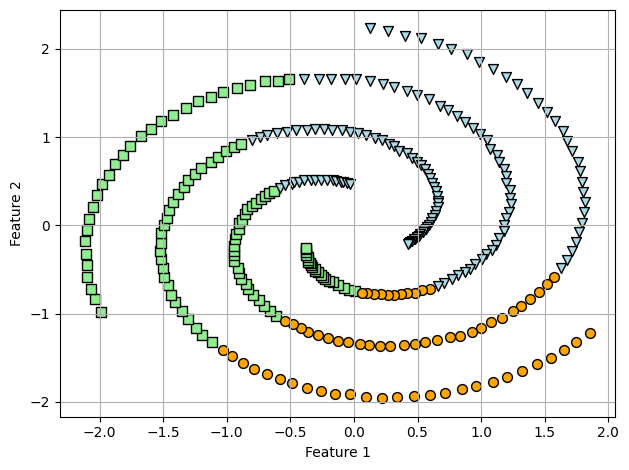

In [28]:
# Show clusters
plt.scatter(X[y_agg_avg == 0, 0],
            X[y_agg_avg == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_agg_avg == 1, 0],
            X[y_agg_avg == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.scatter(X[y_agg_avg == 2, 0],
            X[y_agg_avg == 2, 1],
            s=50,
            c="lightblue",
            marker="v",
            edgecolor="black",
            label="cluster 3")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Hierarchical clustering(single linkage)

In [29]:
agg_single = AgglomerativeClustering(n_clusters=3,
                                 metric="euclidean",
                                 linkage="single")
y_agg_single = agg_single.fit_predict(X)

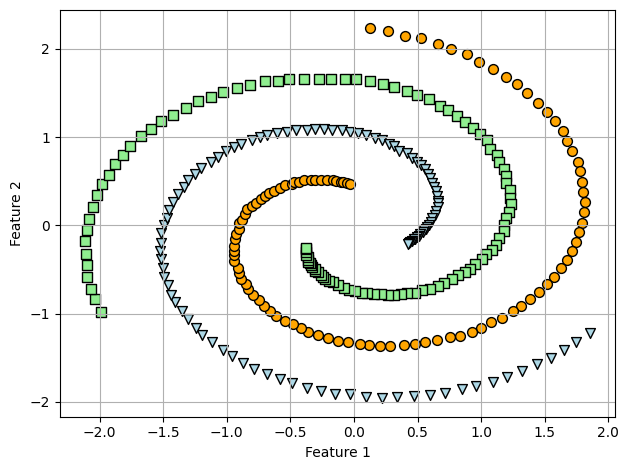

In [30]:
# Show clusters
plt.scatter(X[y_agg_single == 0, 0],
            X[y_agg_single == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_agg_single == 1, 0],
            X[y_agg_single == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.scatter(X[y_agg_single == 2, 0],
            X[y_agg_single == 2, 1],
            s=50,
            c="lightblue",
            marker="v",
            edgecolor="black",
            label="cluster 3")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Hierarchical clustering(complete linkage)

In [31]:
agg_comp = AgglomerativeClustering(n_clusters=3,
                                 metric="euclidean",
                                 linkage="complete")
y_agg_comp = agg_comp.fit_predict(X)

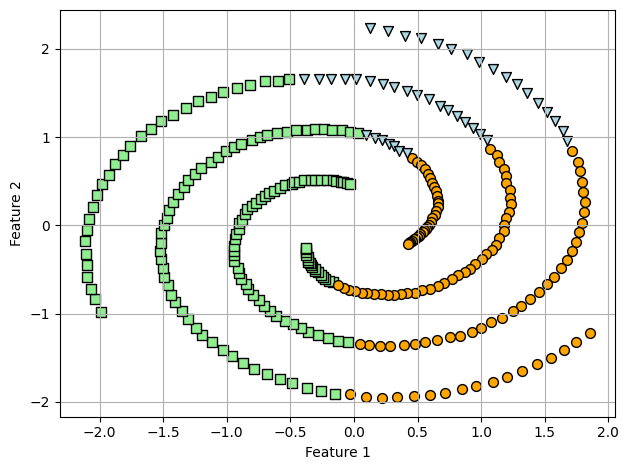

In [32]:
# Show clusters
plt.scatter(X[y_agg_comp == 0, 0],
            X[y_agg_comp == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_agg_comp == 1, 0],
            X[y_agg_comp == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.scatter(X[y_agg_comp == 2, 0],
            X[y_agg_comp == 2, 1],
            s=50,
            c="lightblue",
            marker="v",
            edgecolor="black",
            label="cluster 3")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Spectral clustering

In [33]:
from sklearn.cluster import SpectralClustering

spc = SpectralClustering(n_clusters=3, affinity="nearest_neighbors",
                         assign_labels="discretize",
                         random_state=0)
y_spc = spc.fit_predict(X)

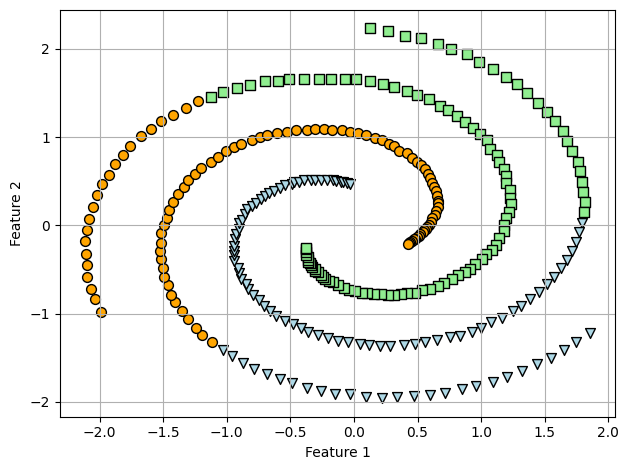

In [34]:
# Show clusters
plt.scatter(X[y_spc == 0, 0],
            X[y_spc == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_spc == 1, 0],
            X[y_spc == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.scatter(X[y_spc == 2, 0],
            X[y_spc == 2, 1],
            s=50,
            c="lightblue",
            marker="v",
            edgecolor="black",
            label="cluster 3")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Purity index evaluation

In [35]:
km_purity = purity(y, y_km)
print(f"Kmeans purity: {km_purity:.4f}")

agg_avg_purity = purity(y, y_agg_avg)
print(f"Hierarchical clustering by average linkage purity: {agg_avg_purity:.4f}")

agg_single_purity = purity(y, y_agg_single)
print(f"Hierarchical clustering by single linkage purity: {agg_single_purity:.4f}")

agg_comp_purity = purity(y, y_agg_comp)
print(f"Hierarchical clustering by complete linkage purity: {agg_comp_purity:.4f}")

spec_purity = purity(y, y_spc)
print(f"Spectral clustering purity: {spec_purity:.4f}")

Kmeans purity: 0.3429
Hierarchical clustering by average linkage purity: 0.4167
Hierarchical clustering by single linkage purity: 1.0000
Hierarchical clustering by complete linkage purity: 0.3750
Spectral clustering purity: 0.7660


#### Rand index evaluation

In [36]:
rand_idx_mat = np.zeros((5, 5))
lbls = [y_km, y_agg_avg, y_agg_single, y_agg_comp, y_spc]

for i, lbl_i in enumerate(lbls):
    for j, lbl_j in enumerate(lbls):
        rand_idx_mat[i, j] = adjusted_rand_score(lbl_i, lbl_j)

print(rand_idx_mat)

[[ 1.          0.46885412 -0.00558528  0.3595997   0.15218546]
 [ 0.46885412  1.          0.0202691   0.27765461  0.13296058]
 [-0.00558528  0.0202691   1.          0.00292431  0.45967788]
 [ 0.3595997   0.27765461  0.00292431  1.          0.07128316]
 [ 0.15218546  0.13296058  0.45967788  0.07128316  1.        ]]


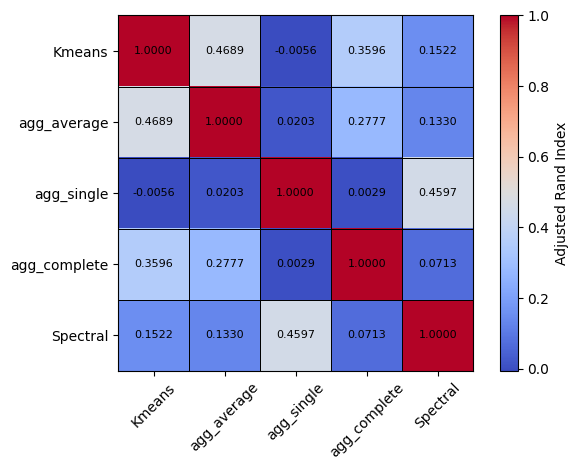

In [37]:
algo_lbls = ["Kmeans", "agg_average", "agg_single", "agg_complete", "Spectral"]
fig, ax = plt.subplots()  
im = ax.imshow(rand_idx_mat, cmap='coolwarm') 
colorbar = plt.colorbar(im, label='Adjusted Rand Index')
ax.set_xticks(range(len(algo_lbls)))
ax.set_yticks(range(len(algo_lbls)))
ax.set_xticklabels(algo_lbls, rotation=45)
ax.set_yticklabels(algo_lbls)
plt.tight_layout()
for i in range(len(algo_lbls)):
    for j in range(len(algo_lbls)):
        ax.axhline(y=i-0.5, color='black', linewidth=0.5)
        ax.axvline(x=j-0.5, color='black', linewidth=0.5)
        ax.text(j, i, f"{rand_idx_mat[i, j]:.4f}", ha='center', va='center', fontsize=8)

plt.show()

In this datasets, hierarchical clustering with single linkage performs the best and Identified true cluster without error. Spectral clustering was the second best with 0.7660 purity index and the others performed poorly on this data.

### 1.3. Jain dataset

In [38]:
# Load data
file_path = "/Users/amirebrahimi/Documents/ML02-03/HW2/jain.txt"
df = pd.read_csv(file_path, delimiter = "\t", header=None)
df = df.rename(columns={0:"f1", 1:"f2", 2:"label"})
df.head()

,f1,f2,label
0,0.85,17.45,2
1,0.75,15.60,2
2,3.30,15.45,2
3,5.25,14.20,2
4,4.90,15.65,2


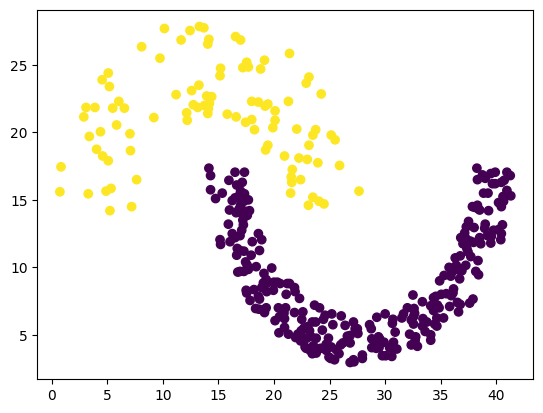

In [39]:
# Plot data
plt.scatter(df["f1"], df["f2"], c = df["label"])
plt.show()

In [40]:
X = df[["f1", "f2"]].values
y = df["label"].values
print(X.shape)
print(y.shape)

(373, 2)
(373,)


In [41]:
np.unique(y)

array([1, 2])

In [42]:
# Z-score normalization of feature vectors
from scipy import stats

X = stats.zscore(X)
print(X[:5])

[[-2.38621213  0.80406423]
 [-2.39637457  0.5236131 ]
 [-2.13723231  0.50087381]
 [-1.9390647   0.31137981]
 [-1.97463325  0.53119286]]


#### Kmeans clustering

In [43]:
km = KMeans(n_clusters=2,  # As dataset suggests
            init="k-means++",
            n_init=10,
            max_iter=300,
            tol=1e-4,
            random_state=0)

y_km = km.fit_predict(X)

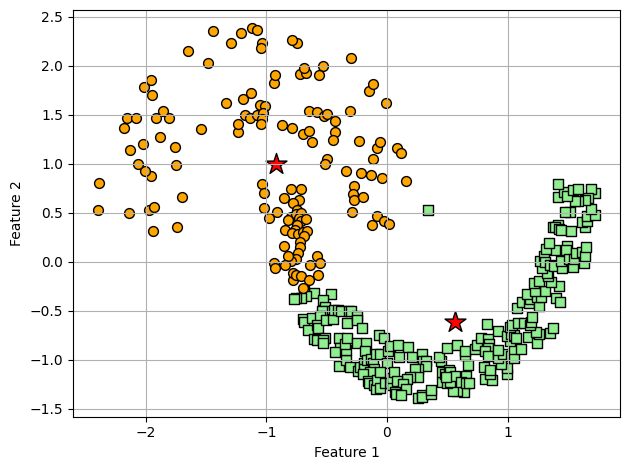

In [44]:
# Show clusters
plt.scatter(X[y_km == 0, 0],
            X[y_km == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_km == 1, 0],
            X[y_km == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.scatter(km.cluster_centers_[:, 0],
            km.cluster_centers_[:, 1],
            s=250, marker="*", c= "red", 
            edgecolor="black", label="Centroids")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Hierarchical clustering (average linkage)

In [45]:
agg_avg = AgglomerativeClustering(n_clusters=2,
                                 metric="euclidean",
                                 linkage="average")
y_agg_avg = agg_avg.fit_predict(X)

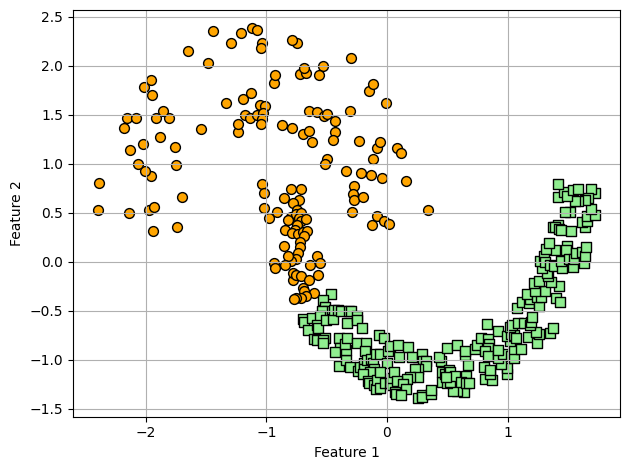

In [46]:
# Show clusters
plt.scatter(X[y_agg_avg == 0, 0],
            X[y_agg_avg == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_agg_avg == 1, 0],
            X[y_agg_avg == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Hierarchical clustering(single linkage)

In [47]:
agg_single = AgglomerativeClustering(n_clusters=2,
                                 metric="euclidean",
                                 linkage="single")
y_agg_single = agg_single.fit_predict(X)

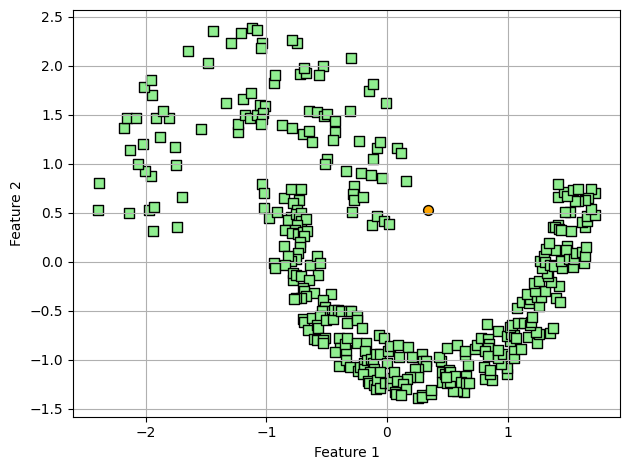

In [48]:
# Show clusters
plt.scatter(X[y_agg_single == 0, 0],
            X[y_agg_single == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_agg_single == 1, 0],
            X[y_agg_single == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Hierarchical clustering (complete linkage)

In [49]:
agg_comp = AgglomerativeClustering(n_clusters=2,
                                 metric="euclidean",
                                 linkage="complete")
y_agg_comp = agg_comp.fit_predict(X)

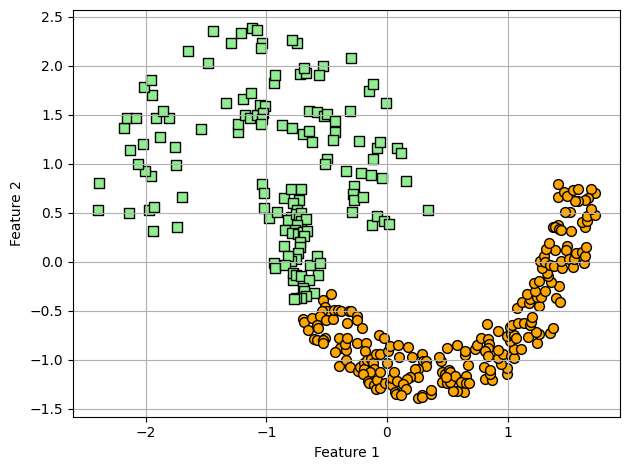

In [50]:
# Show clusters
plt.scatter(X[y_agg_comp == 0, 0],
            X[y_agg_comp == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_agg_comp == 1, 0],
            X[y_agg_comp == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Spectral clustering

In [51]:
spc = SpectralClustering(n_clusters=2, affinity="nearest_neighbors",
                         assign_labels="discretize",
                         random_state=0)
y_spc = spc.fit_predict(X)

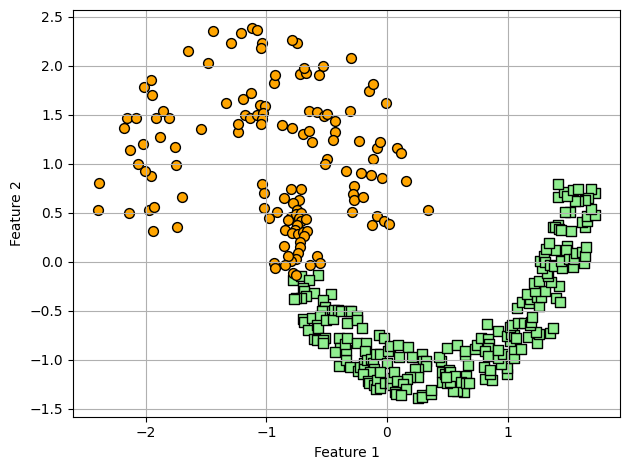

In [52]:
# Show clusters
plt.scatter(X[y_spc == 0, 0],
            X[y_spc == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_spc == 1, 0],
            X[y_spc == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Purity index evaluation

In [53]:
km_purity = purity(y, y_km)
print(f"Kmeans purity: {km_purity:.4f}")

agg_avg_purity = purity(y, y_agg_avg)
print(f"Hierarchical clustering by average linkage purity: {agg_avg_purity:.4f}")

agg_single_purity = purity(y, y_agg_single)
print(f"Hierarchical clustering by single linkage purity: {agg_single_purity:.4f}")

agg_comp_purity = purity(y, y_agg_comp)
print(f"Hierarchical clustering by complete linkage purity: {agg_comp_purity:.4f}")

spec_purity = purity(y, y_spc)
print(f"Spectral clustering purity: {spec_purity:.4f}")

Kmeans purity: 0.8740
Hierarchical clustering by average linkage purity: 0.8606
Hierarchical clustering by single linkage purity: 0.7426
Hierarchical clustering by complete linkage purity: 0.8606
Spectral clustering purity: 0.8901


#### Rand index evaluation

In [54]:
rand_idx_mat = np.zeros((5, 5))
lbls = [y_km, y_agg_avg, y_agg_single, y_agg_comp, y_spc]

for i, lbl_i in enumerate(lbls):
    for j, lbl_j in enumerate(lbls):
        rand_idx_mat[i, j] = adjusted_rand_score(lbl_i, lbl_j)

print(rand_idx_mat)

[[ 1.          0.92599135 -0.00206458  0.92599135  0.936296  ]
 [ 0.92599135  1.          0.00269782  1.          0.88492492]
 [-0.00206458  0.00269782  1.          0.00269782  0.00376608]
 [ 0.92599135  1.          0.00269782  1.          0.88492492]
 [ 0.936296    0.88492492  0.00376608  0.88492492  1.        ]]


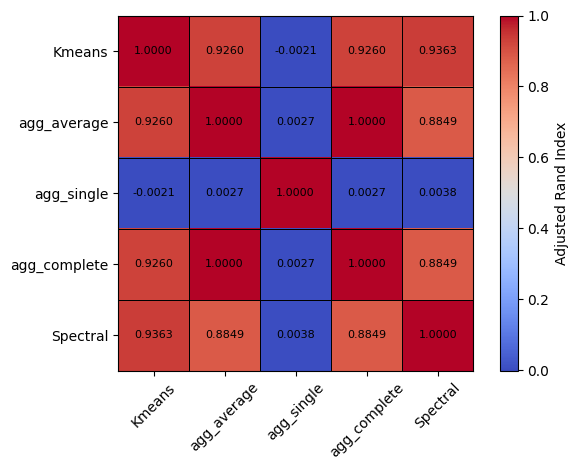

In [55]:
algo_lbls = ["Kmeans", "agg_average", "agg_single", "agg_complete", "Spectral"]
fig, ax = plt.subplots()  
im = ax.imshow(rand_idx_mat, cmap='coolwarm') 
colorbar = plt.colorbar(im, label='Adjusted Rand Index')
ax.set_xticks(range(len(algo_lbls)))
ax.set_yticks(range(len(algo_lbls)))
ax.set_xticklabels(algo_lbls, rotation=45)
ax.set_yticklabels(algo_lbls)
plt.tight_layout()
for i in range(len(algo_lbls)):
    for j in range(len(algo_lbls)):
        ax.axhline(y=i-0.5, color='black', linewidth=0.5)
        ax.axvline(x=j-0.5, color='black', linewidth=0.5)
        ax.text(j, i, f"{rand_idx_mat[i, j]:.4f}", ha='center', va='center', fontsize=8)

plt.show()

In this dataset, all algorithms performed well except Hierarchical clustering with single linkage. 

### 1.4. Flame dataset

In [56]:
# Load data
file_path = "/Users/amirebrahimi/Documents/ML02-03/HW2/flame.txt"
df = pd.read_csv(file_path, delimiter = "\t", header=None)
df = df.rename(columns={0:"f1", 1:"f2", 2:"label"})
df.head()

,f1,f2,label
0,1.85,27.80,1
1,1.35,26.65,1
2,1.40,23.25,2
3,0.85,23.05,2
4,0.50,22.35,2


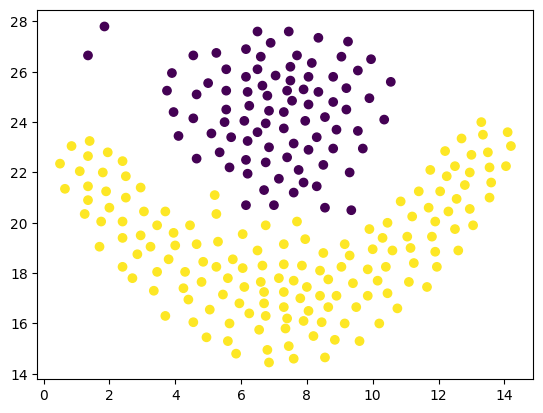

In [57]:
# Plot data
plt.scatter(df["f1"], df["f2"], c = df["label"])
plt.show()

In [58]:
X = df[["f1", "f2"]].values
y = df["label"].values
print(X.shape)
print(y.shape)

(240, 2)
(240,)


In [59]:
np.unique(y)

array([1, 2])

In [60]:
# Z-score normalization of feature vectors
from scipy import stats

X = stats.zscore(X)
print(X[:5])

[[-1.71277864  2.03518305]
 [-1.8692325   1.69457697]
 [-1.85358711  0.68756768]
 [-2.02568636  0.62833184]
 [-2.13520406  0.4210064 ]]


#### Kmeans clustering

In [61]:
km = KMeans(n_clusters=2,  # As dataset suggests
            init="k-means++",
            n_init=10,
            max_iter=300,
            tol=1e-4,
            random_state=0)

y_km = km.fit_predict(X)

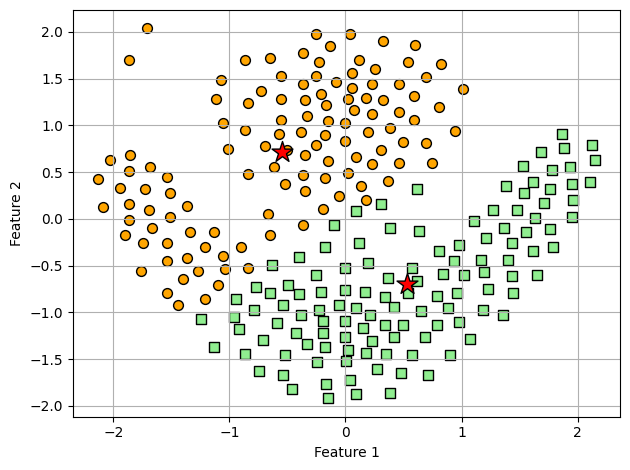

In [62]:
# Show clusters
plt.scatter(X[y_km == 0, 0],
            X[y_km == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_km == 1, 0],
            X[y_km == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.scatter(km.cluster_centers_[:, 0],
            km.cluster_centers_[:, 1],
            s=250, marker="*", c= "red", 
            edgecolor="black", label="Centroids")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()

#### Hierarchical clustering (average linkage)

In [63]:
agg_avg = AgglomerativeClustering(n_clusters=2,
                                 metric="euclidean",
                                 linkage="average")
y_agg_avg = agg_avg.fit_predict(X)

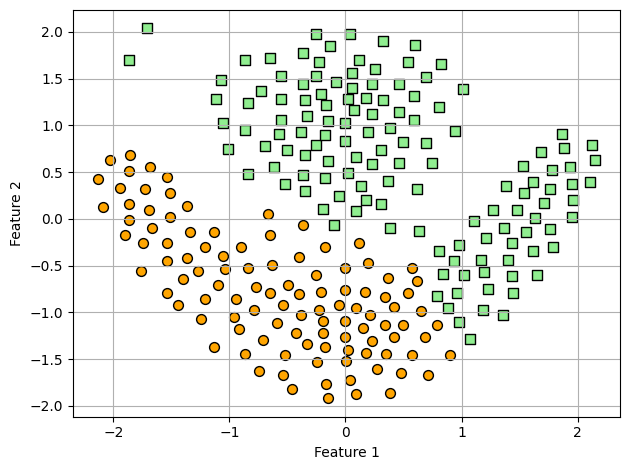

In [64]:
# Show clusters
plt.scatter(X[y_agg_avg == 0, 0],
            X[y_agg_avg == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_agg_avg == 1, 0],
            X[y_agg_avg == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Hierarchical clustering (single linkage)

In [65]:
agg_single = AgglomerativeClustering(n_clusters=2,
                                 metric="euclidean",
                                 linkage="single")
y_agg_single = agg_single.fit_predict(X)

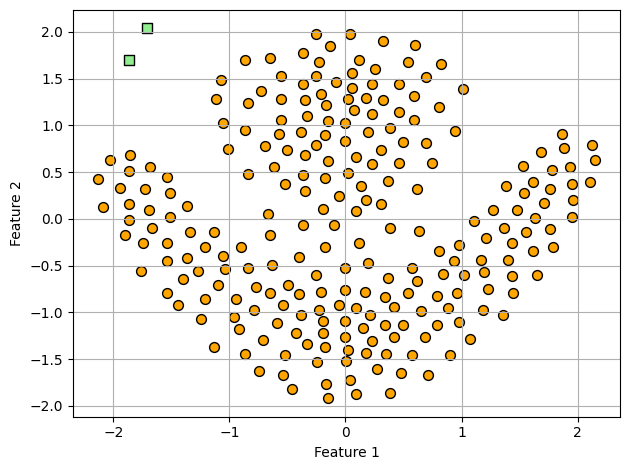

In [66]:
# Show clusters
plt.scatter(X[y_agg_single == 0, 0],
            X[y_agg_single == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_agg_single == 1, 0],
            X[y_agg_single == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Hierarchical clustering (complete linkage)

In [67]:
agg_comp = AgglomerativeClustering(n_clusters=3,
                                 metric="euclidean",
                                 linkage="complete")
y_agg_comp = agg_comp.fit_predict(X)

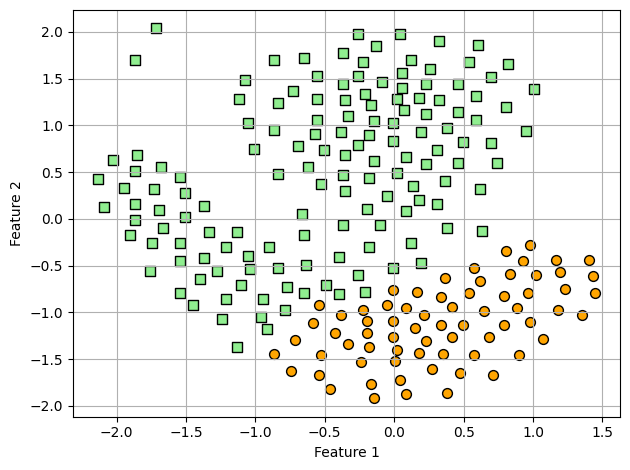

In [68]:
# Show clusters
plt.scatter(X[y_agg_comp == 0, 0],
            X[y_agg_comp == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_agg_comp == 1, 0],
            X[y_agg_comp == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Spectral clustering

In [69]:
spc = SpectralClustering(n_clusters=3, affinity="nearest_neighbors",
                         assign_labels="discretize",
                         random_state=0)
y_spc = spc.fit_predict(X)

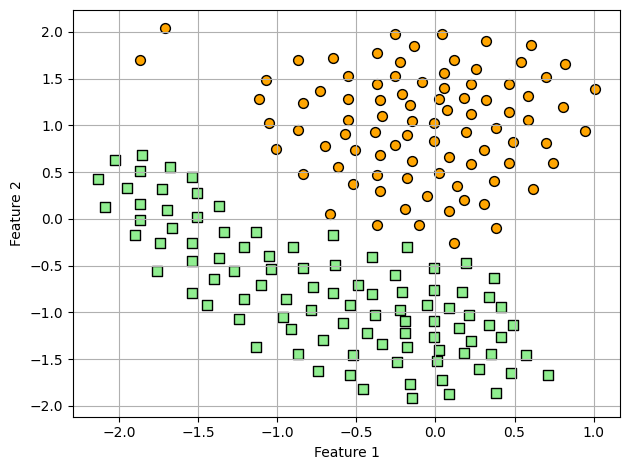

In [70]:
# Show clusters
plt.scatter(X[y_spc == 0, 0],
            X[y_spc == 0, 1],
            s=50,
            c="lightgreen",
            marker="s",
            edgecolor="black",
            label="cluster 1")
plt.scatter(X[y_spc == 1, 0],
            X[y_spc == 1, 1],
            s=50,
            c="orange",
            marker="o",
            edgecolor="black",
            label="cluster 2")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.grid()
plt.tight_layout()
plt.show()

#### Purity index evaluation

In [71]:
km_purity = purity(y, y_km)
print(f"Kmeans purity: {km_purity:.4f}")

agg_avg_purity = purity(y, y_agg_avg)
print(f"Hierarchical clustering by average linkage purity: {agg_avg_purity:.4f}")

agg_single_purity = purity(y, y_agg_single)
print(f"Hierarchical clustering by single linkage purity: {agg_single_purity:.4f}")

agg_comp_purity = purity(y, y_agg_comp)
print(f"Hierarchical clustering by complete linkage purity: {agg_comp_purity:.4f}")

spec_purity = purity(y, y_spc)
print(f"Spectral clustering purity: {spec_purity:.4f}")

Kmeans purity: 0.8208
Hierarchical clustering by average linkage purity: 0.8000
Hierarchical clustering by single linkage purity: 0.6458
Hierarchical clustering by complete linkage purity: 0.7708
Spectral clustering purity: 0.9875


#### Rand index evaluation

In [72]:
rand_idx_mat = np.zeros((5, 5))
lbls = [y_km, y_agg_avg, y_agg_single, y_agg_comp, y_spc]

for i, lbl_i in enumerate(lbls):
    for j, lbl_j in enumerate(lbls):
        rand_idx_mat[i, j] = adjusted_rand_score(lbl_i, lbl_j)

print(rand_idx_mat)

[[ 1.00000000e+00  5.44911065e-02  7.04532737e-04  4.98738704e-01
   3.23392656e-01]
 [ 5.44911065e-02  1.00000000e+00 -3.11788265e-03  8.34718540e-02
   6.06073083e-01]
 [ 7.04532737e-04 -3.11788265e-03  1.00000000e+00 -8.59437140e-03
  -7.05075961e-04]
 [ 4.98738704e-01  8.34718540e-02 -8.59437140e-03  1.00000000e+00
   3.49462654e-01]
 [ 3.23392656e-01  6.06073083e-01 -7.05075961e-04  3.49462654e-01
   1.00000000e+00]]


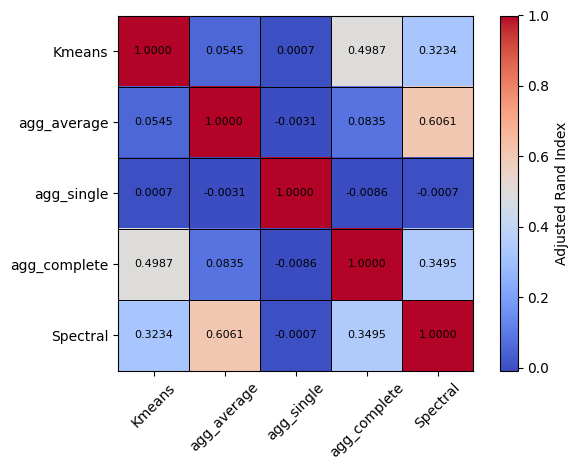

In [73]:
algo_lbls = ["Kmeans", "agg_average", "agg_single", "agg_complete", "Spectral"]
fig, ax = plt.subplots()  
im = ax.imshow(rand_idx_mat, cmap='coolwarm') 
colorbar = plt.colorbar(im, label='Adjusted Rand Index')
ax.set_xticks(range(len(algo_lbls)))
ax.set_yticks(range(len(algo_lbls)))
ax.set_xticklabels(algo_lbls, rotation=45)
ax.set_yticklabels(algo_lbls)
plt.tight_layout()
for i in range(len(algo_lbls)):
    for j in range(len(algo_lbls)):
        ax.axhline(y=i-0.5, color='black', linewidth=0.5)
        ax.axvline(x=j-0.5, color='black', linewidth=0.5)
        ax.text(j, i, f"{rand_idx_mat[i, j]:.4f}", ha='center', va='center', fontsize=8)

plt.show()

In this dataset, all performed well in identifying clusters except hierarchical clustering with single linkage.

#### 1.5. S1 and S4 datasets

In [74]:
# Load data
file_path1 = "/Users/amirebrahimi/Documents/ML02-03/HW2/s1.txt"
file_path2 = "/Users/amirebrahimi/Documents/ML02-03/HW2/s4.txt"
df1 = pd.read_csv(file_path1, delim_whitespace=True, header=None, names=['f1', 'f2'])
df2 = pd.read_csv(file_path2, delim_whitespace=True, header=None, names=['f1', 'f2'])

In [75]:
df1.head()

,f1,f2
0,664159,550946
1,665845,557965
2,597173,575538
3,618600,551446
4,635690,608046


In [76]:
df2.head()

,f1,f2
0,624474,837604
1,673412,735362
2,647442,677000
3,532283,741384
4,646529,742844


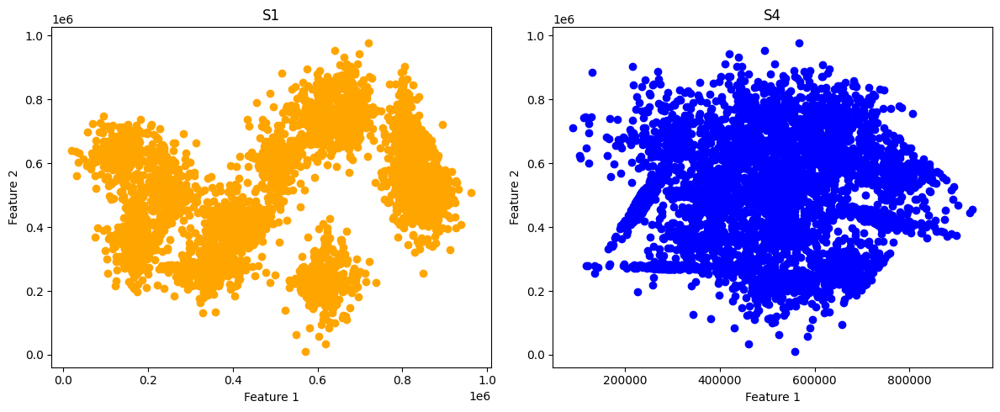

In [77]:
# Plot data
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))
axes[0].scatter(df1["f1"], df2["f2"], color="orange")
axes[0].set_title("S1")
axes[0].set_xlabel("Feature 1")
axes[0].set_ylabel("Feature 2")

axes[1].scatter(df2["f1"], df2["f2"], color="blue")
axes[1].set_title("S4")
axes[1].set_xlabel("Feature 1")
axes[1].set_ylabel("Feature 2")

plt.tight_layout()
plt.show()

In [78]:
X_s1 = df1[["f1", "f2"]].values
X_s4 = df2[["f1", "f2"]].values
print(X_s1.shape, X_s4.shape)

(5000, 2) (5000, 2)


In [79]:
# Z-score normalization

X_s1 = stats.zscore(X_s1)
X_s4 = stats.zscore(X_s4)

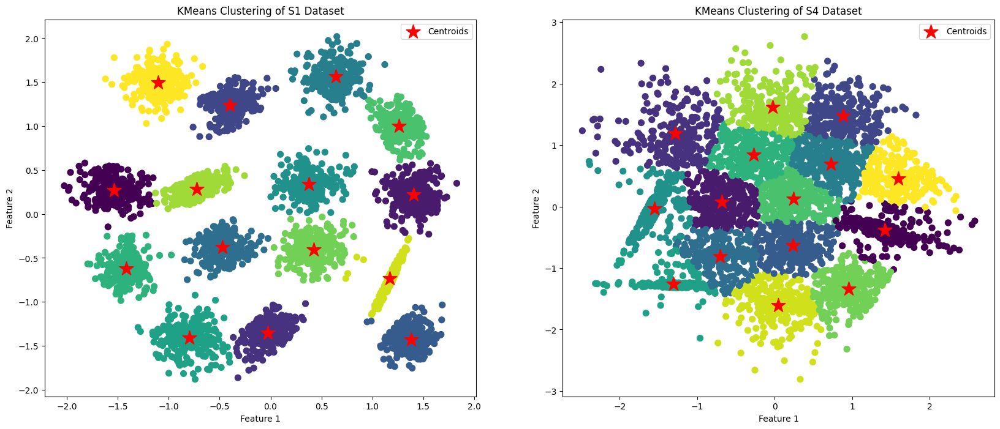

In [80]:
km_s1 = KMeans(n_clusters=15,  
               init="k-means++",
               n_init=10,
               max_iter=300,
               tol=1e-4,
               random_state=0)

y_km_s1 = km_s1.fit_predict(X_s1)

km_s4 = KMeans(n_clusters=15, 
               init="k-means++",
               n_init=10,
               max_iter=300,
               tol=1e-4,
               random_state=0)

y_km_s4 = km_s4.fit_predict(X_s4)

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

axes[0].scatter(X_s1[:, 0], X_s1[:, 1], c=y_km_s1, s=50, cmap='viridis')
axes[0].scatter(km_s1.cluster_centers_[:, 0], km_s1.cluster_centers_[:, 1], s=300, c='red', marker='*', label='Centroids')
axes[0].set_title('KMeans Clustering of S1 Dataset')
axes[0].set_xlabel('Feature 1')
axes[0].set_ylabel('Feature 2')
axes[0].legend()

axes[1].scatter(X_s4[:, 0], X_s4[:, 1], c=y_km_s4, s=50, cmap='viridis')
axes[1].scatter(km_s4.cluster_centers_[:, 0], km_s4.cluster_centers_[:, 1], s=300, c='red', marker='*', label='Centroids')
axes[1].set_title('KMeans Clustering of S4 Dataset')
axes[1].set_xlabel('Feature 1')
axes[1].set_ylabel('Feature 2')
axes[1].legend()

plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


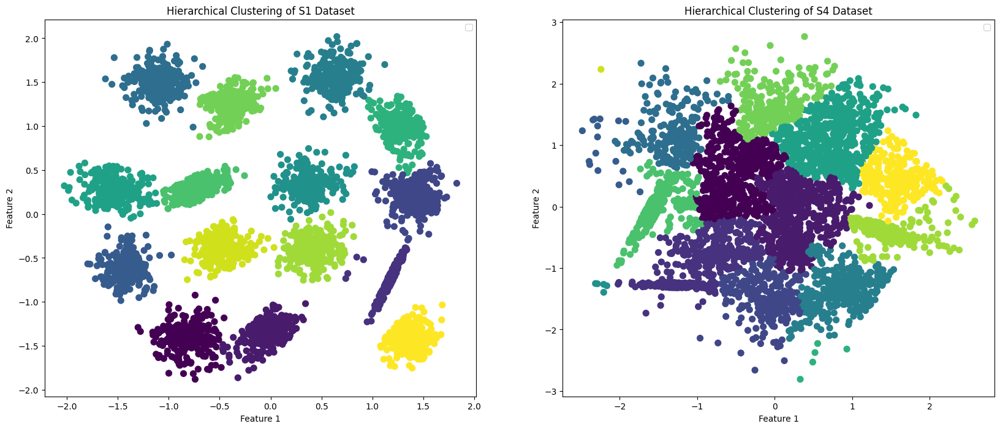

In [81]:
agg_avg_1 = AgglomerativeClustering(n_clusters=15,
                                 metric="euclidean",
                                 linkage="average")
y_agg_avg_1 = agg_avg_1.fit_predict(X_s1)

agg_avg_4 = AgglomerativeClustering(n_clusters=15,
                                 metric="euclidean",
                                 linkage="average")
y_agg_avg_4 = agg_avg_4.fit_predict(X_s4)

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

axes[0].scatter(X_s1[:, 0], X_s1[:, 1], c=y_agg_avg_1, s=50, cmap='viridis')
axes[0].set_title('Hierarchical Clustering of S1 Dataset')
axes[0].set_xlabel('Feature 1')
axes[0].set_ylabel('Feature 2')
axes[0].legend()

axes[1].scatter(X_s4[:, 0], X_s4[:, 1], c=y_agg_avg_4, s=50, cmap='viridis')
axes[1].set_title('Hierarchical Clustering of S4 Dataset')
axes[1].set_xlabel('Feature 1')
axes[1].set_ylabel('Feature 2')
axes[1].legend()

plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


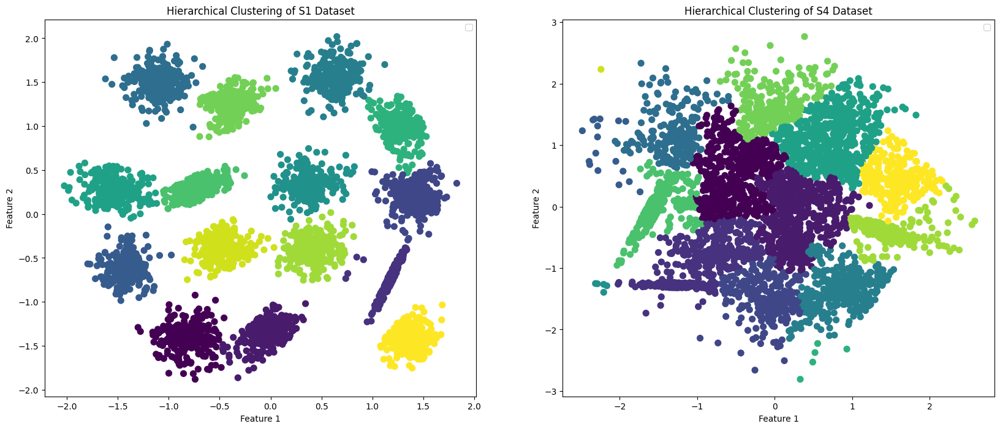

In [82]:
agg_single_1 = AgglomerativeClustering(n_clusters=15,
                                 metric="euclidean",
                                 linkage="single")
y_agg_single_1 = agg_avg_1.fit_predict(X_s1)

agg_single_4 = AgglomerativeClustering(n_clusters=15,
                                 metric="euclidean",
                                 linkage="single")
y_agg_single_4 = agg_avg_4.fit_predict(X_s4)

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

axes[0].scatter(X_s1[:, 0], X_s1[:, 1], c=y_agg_single_1, s=50, cmap='viridis')
axes[0].set_title('Hierarchical Clustering of S1 Dataset')
axes[0].set_xlabel('Feature 1')
axes[0].set_ylabel('Feature 2')
axes[0].legend()

axes[1].scatter(X_s4[:, 0], X_s4[:, 1], c=y_agg_single_4, s=50, cmap='viridis')
axes[1].set_title('Hierarchical Clustering of S4 Dataset')
axes[1].set_xlabel('Feature 1')
axes[1].set_ylabel('Feature 2')
axes[1].legend()

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


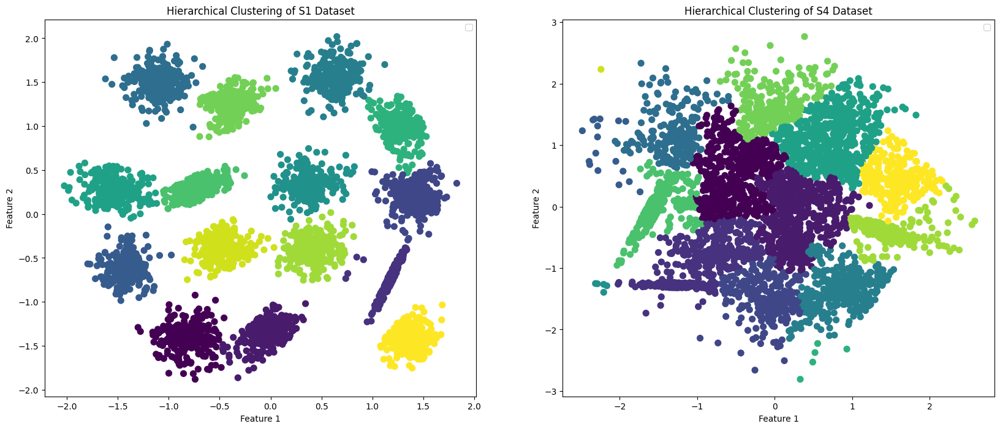

In [83]:
agg_comp_1 = AgglomerativeClustering(n_clusters=15,
                                 metric="euclidean",
                                 linkage="complete")
y_agg_comp_1 = agg_avg_1.fit_predict(X_s1)

agg_comp_4 = AgglomerativeClustering(n_clusters=15,
                                 metric="euclidean",
                                 linkage="complete")
y_agg_comp_4 = agg_avg_4.fit_predict(X_s4)

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

axes[0].scatter(X_s1[:, 0], X_s1[:, 1], c=y_agg_comp_1, s=50, cmap='viridis')
axes[0].set_title('Hierarchical Clustering of S1 Dataset')
axes[0].set_xlabel('Feature 1')
axes[0].set_ylabel('Feature 2')
axes[0].legend()

axes[1].scatter(X_s4[:, 0], X_s4[:, 1], c=y_agg_comp_4, s=50, cmap='viridis')
axes[1].set_title('Hierarchical Clustering of S4 Dataset')
axes[1].set_xlabel('Feature 1')
axes[1].set_ylabel('Feature 2')
axes[1].legend()

plt.show()

/opt/homebrew/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


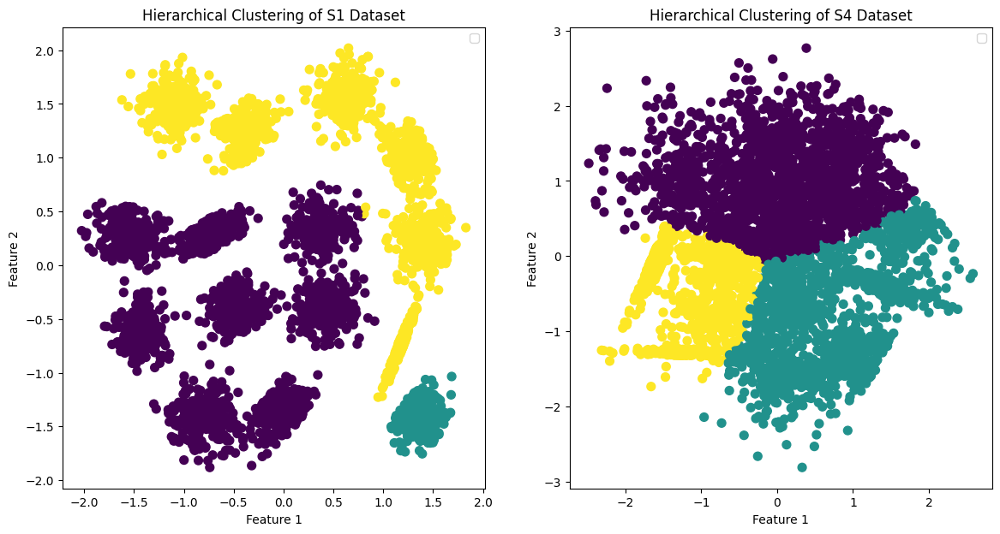

In [84]:
spc_s1 = SpectralClustering(n_clusters=15, affinity="nearest_neighbors", 
                         assign_labels="discretize",
                         random_state=0)
y_spc_s1 = spc.fit_predict(X_s1)

spc_s4 = SpectralClustering(n_clusters=15, affinity="nearest_neighbors", 
                         assign_labels="discretize",
                         random_state=0)
y_spc_s4 = spc.fit_predict(X_s4)

fig, axes = plt.subplots(1, 2, figsize=(14, 7))
axes[0].scatter(X_s1[:, 0], X_s1[:, 1], c=y_spc_s1, s=50, cmap='viridis')
axes[0].set_title('Hierarchical Clustering of S1 Dataset')
axes[0].set_xlabel('Feature 1')
axes[0].set_ylabel('Feature 2')
axes[0].legend()

axes[1].scatter(X_s4[:, 0], X_s4[:, 1], c=y_spc_s4, s=50, cmap='viridis')
axes[1].set_title('Hierarchical Clustering of S4 Dataset')
axes[1].set_xlabel('Feature 1')
axes[1].set_ylabel('Feature 2')
axes[1].legend()

plt.show()

In [85]:
rand_idx_mat = np.zeros((5, 5))
lbls = [y_km_s1, y_agg_avg_1, y_agg_single_1, y_agg_comp_1, y_spc_s1]

for i, lbl_i in enumerate(lbls):
    for j, lbl_j in enumerate(lbls):
        rand_idx_mat[i, j] = adjusted_rand_score(lbl_i, lbl_j)

print(rand_idx_mat)

[[1.         0.98972724 0.98972724 0.98972724 0.15912764]
 [0.98972724 1.         1.         1.         0.15937154]
 [0.98972724 1.         1.         1.         0.15937154]
 [0.98972724 1.         1.         1.         0.15937154]
 [0.15912764 0.15937154 0.15937154 0.15937154 1.        ]]


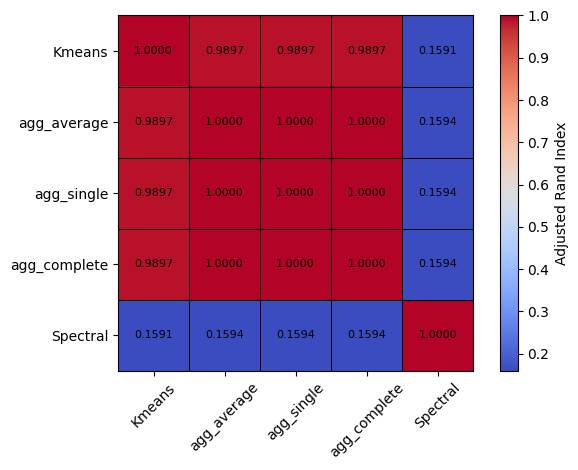

In [86]:
algo_lbls = ["Kmeans", "agg_average", "agg_single", "agg_complete", "Spectral"]
fig, ax = plt.subplots()  
im = ax.imshow(rand_idx_mat, cmap='coolwarm') 
colorbar = plt.colorbar(im, label='Adjusted Rand Index')
ax.set_xticks(range(len(algo_lbls)))
ax.set_yticks(range(len(algo_lbls)))
ax.set_xticklabels(algo_lbls, rotation=45)
ax.set_yticklabels(algo_lbls)
plt.tight_layout()
for i in range(len(algo_lbls)):
    for j in range(len(algo_lbls)):
        ax.axhline(y=i-0.5, color='black', linewidth=0.5)
        ax.axvline(x=j-0.5, color='black', linewidth=0.5)
        ax.text(j, i, f"{rand_idx_mat[i, j]:.4f}", ha='center', va='center', fontsize=8)

plt.show()

In [87]:
rand_idx_mat = np.zeros((5, 5))
lbls = [y_km_s4, y_agg_avg_4, y_agg_single_4, y_agg_comp_4, y_spc_s4]

for i, lbl_i in enumerate(lbls):
    for j, lbl_j in enumerate(lbls):
        rand_idx_mat[i, j] = adjusted_rand_score(lbl_i, lbl_j)

print(rand_idx_mat)

[[1.         0.62368596 0.62368596 0.62368596 0.20112309]
 [0.62368596 1.         1.         1.         0.2559584 ]
 [0.62368596 1.         1.         1.         0.2559584 ]
 [0.62368596 1.         1.         1.         0.2559584 ]
 [0.20112309 0.2559584  0.2559584  0.2559584  1.        ]]


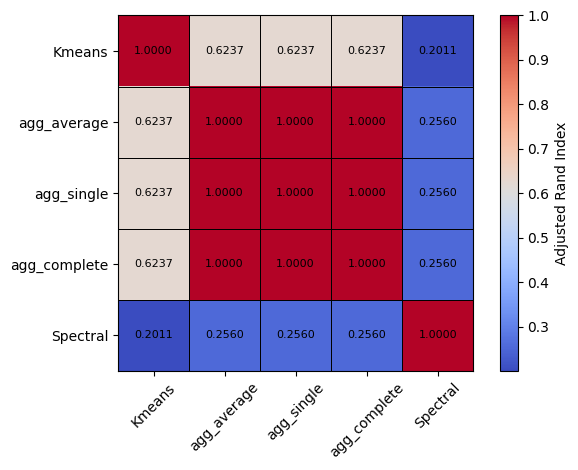

In [88]:
algo_lbls = ["Kmeans", "agg_average", "agg_single", "agg_complete", "Spectral"]
fig, ax = plt.subplots()  
im = ax.imshow(rand_idx_mat, cmap='coolwarm') 
colorbar = plt.colorbar(im, label='Adjusted Rand Index')
ax.set_xticks(range(len(algo_lbls)))
ax.set_yticks(range(len(algo_lbls)))
ax.set_xticklabels(algo_lbls, rotation=45)
ax.set_yticklabels(algo_lbls)
plt.tight_layout()
for i in range(len(algo_lbls)):
    for j in range(len(algo_lbls)):
        ax.axhline(y=i-0.5, color='black', linewidth=0.5)
        ax.axvline(x=j-0.5, color='black', linewidth=0.5)
        ax.text(j, i, f"{rand_idx_mat[i, j]:.4f}", ha='center', va='center', fontsize=8)

plt.show()

Based on the ARI evaluation, spectral clustering poorly the worst in on S1 and S4 data and the resulting cluster labels are more different from other clustering algorithms.

### **2. PCA on MNIST data**
### Dataset

In [1]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset

In [90]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
mnist_train = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
mnist_test = datasets.MNIST(root='./data', train=False, transform=transform, download=True)

In [91]:
# Separating data into smaller datasets
subsets = {}
for i in range(10):
    subsets[i] = [x for x, y in mnist_train if y == i]

for lbl, subset in subsets.items():
    print(f"Label {lbl}: {len(subset)} images")

Label 0: 5923 images
Label 1: 6742 images
Label 2: 5958 images
Label 3: 6131 images
Label 4: 5842 images
Label 5: 5421 images
Label 6: 5918 images
Label 7: 6265 images
Label 8: 5851 images
Label 9: 5949 images


### For labels 0

In [92]:
# Flattening images
lbl_0_imgs = torch.stack(subsets[0], dim=0)
lbl_0_imgs = lbl_0_imgs.reshape(lbl_0_imgs.shape[0], -1)
print(lbl_0_imgs.shape)

torch.Size([5923, 784])


In [93]:
from sklearn.decomposition import PCA

In [94]:
# PCA

pca = PCA(n_components=2)
lbl_0_imgs_np = lbl_0_imgs.numpy()
lbl_0_imgs_pca = pca.fit_transform(lbl_0_imgs_np)
print(lbl_0_imgs_pca.shape)

(5923, 2)


In [95]:
import matplotlib.pyplot as plt

/var/folders/tm/pvz0w3rn0vg96l962tm72tp40000gn/T/ipykernel_2445/2086239546.py:3: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(lbl_0_imgs_pca[:, 0], lbl_0_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)


Text(0.5, 1.0, 'PCA of Label 0 Images')

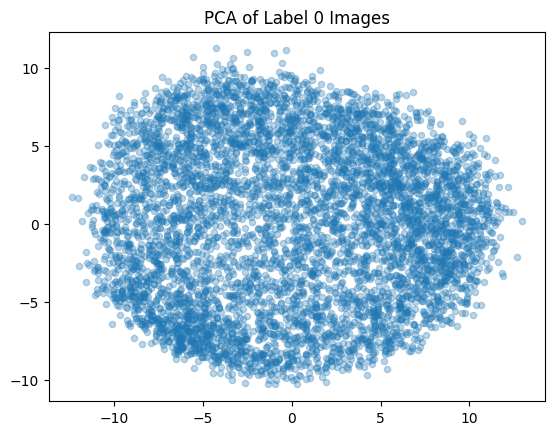

In [96]:
# Plot first two principal components

plt.scatter(lbl_0_imgs_pca[:, 0], lbl_0_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)
plt.title('PCA of Label 0 Images')

In [101]:
def plot_grid_points(pca_emb, num_cells=5):
    # Finding min and max of each principal component
    x1, x2 = np.min(pca_emb[:, 0]), np.max(pca_emb[:, 0])
    y1, y2 = np.min(pca_emb[:, 1]), np.max(pca_emb[:, 1])

    # Splitting space into 5 by 5 grids
    x_grid = np.linspace(x1, x2, num_cells + 1)
    y_grid = np.linspace(y1, y2, num_cells + 1) 

    # Finding the closest point to the center of each grid
    highlighted_points = []
    for i in range(num_cells):
        for j in range(num_cells):
            x_center = (x_grid[i] + x_grid[i + 1]) / 2
            y_center = (y_grid[j] + y_grid[j + 1]) / 2
            distances = np.sqrt((pca_emb[:, 0] - x_center) ** 2 +
                                (pca_emb[:, 1] - y_center) ** 2)
            closest_point_index = np.argmin(distances)
            highlighted_points.append(closest_point_index)

    highlighted_points = np.unique(highlighted_points)

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.scatter(pca_emb[highlighted_points, 0], 
                pca_emb[highlighted_points, 1], 
                c='red', s=50, edgecolors='k', label='Closest to Grid Center')

    ax.scatter(pca_emb[:, 0], pca_emb[:, 1], s=20, alpha=0.3)

    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_title('PCA plot')
    ax.legend()
    for x in x_grid:
        ax.axvline(x, color='gray', linestyle='--', linewidth=1)
    for y in y_grid:
        ax.axhline(y, color='gray', linestyle='--', linewidth=1)
    plt.show()
    
    return fig, ax, highlighted_points

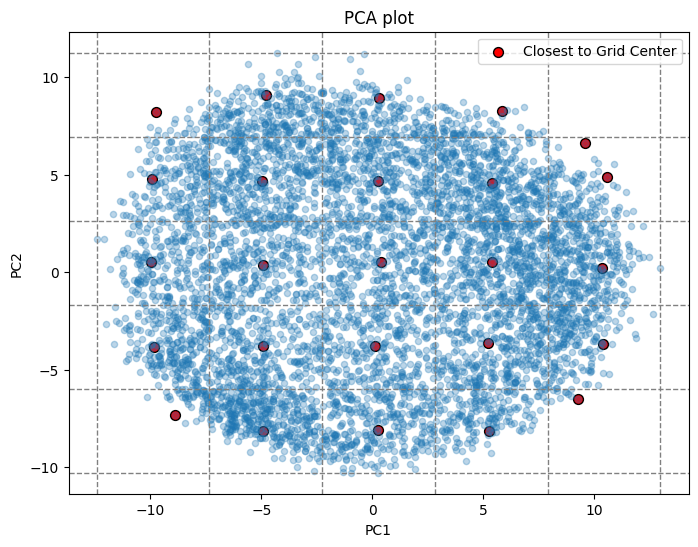

In [102]:
_, _, highlighted_points = plot_grid_points(lbl_0_imgs_pca)

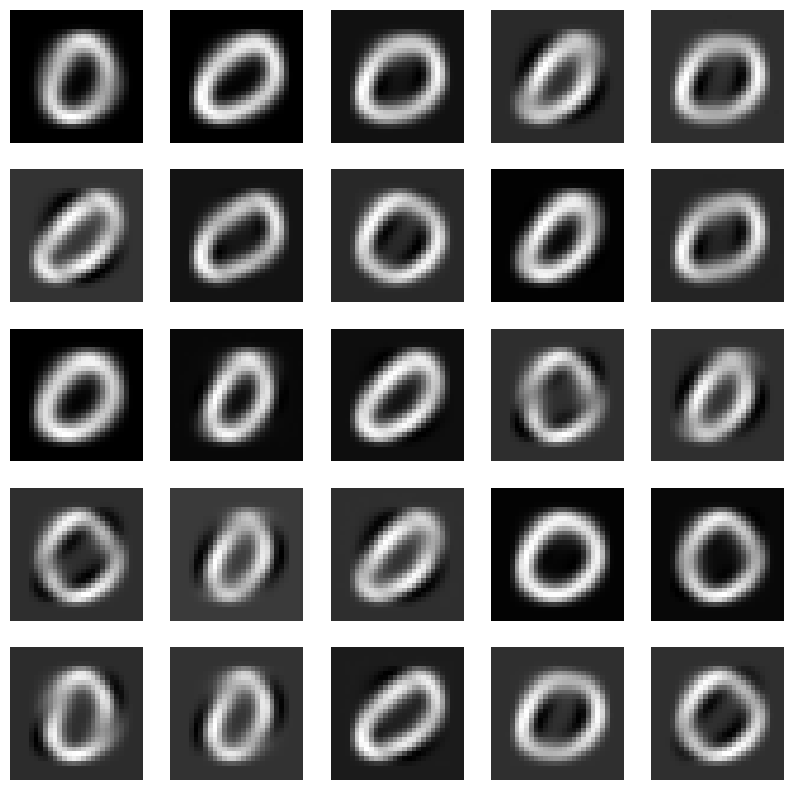

In [103]:
# Showing the original images of the highlighted points
num_imgs = 25
plt.figure(figsize=(10, 10))
for i, index in enumerate(highlighted_points[:num_imgs]):
    inverse_transformed_point = pca.inverse_transform(lbl_0_imgs_pca[index].reshape(1, -1))
    original_image = inverse_transformed_point.reshape((28, 28))
    plt.subplot(5, 5, i + 1)
    plt.imshow(original_image, cmap='gray')
    plt.axis('off')

plt.show()

### For label 1

In [151]:
# Flattening images
lbl_1_imgs = torch.stack(subsets[1], dim=0)
lbl_1_imgs = lbl_1_imgs.reshape(lbl_1_imgs.shape[0], -1)
print(lbl_1_imgs.shape)

torch.Size([6742, 784])


In [152]:
pca = PCA(n_components=2)
lbl_1_imgs_np = lbl_1_imgs.numpy()
lbl_1_imgs_pca = pca.fit_transform(lbl_1_imgs_np)
print(lbl_1_imgs_pca.shape)

(6742, 2)


/var/folders/tm/pvz0w3rn0vg96l962tm72tp40000gn/T/ipykernel_2445/3589194211.py:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(lbl_1_imgs_pca[:, 0], lbl_1_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)


Text(0.5, 1.0, 'PCA of Label 1 Images')

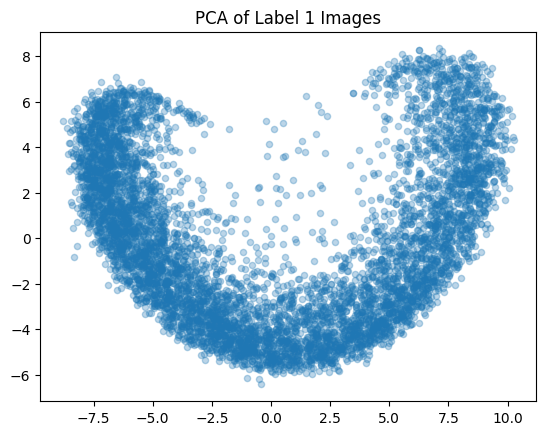

In [153]:
plt.scatter(lbl_1_imgs_pca[:, 0], lbl_1_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)
plt.title('PCA of Label 1 Images')

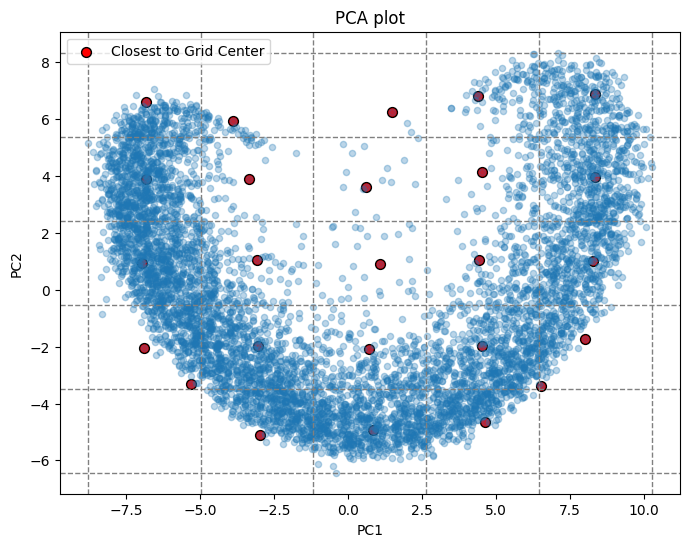

In [154]:
_, _, highlighted_points = plot_grid_points(lbl_1_imgs_pca)

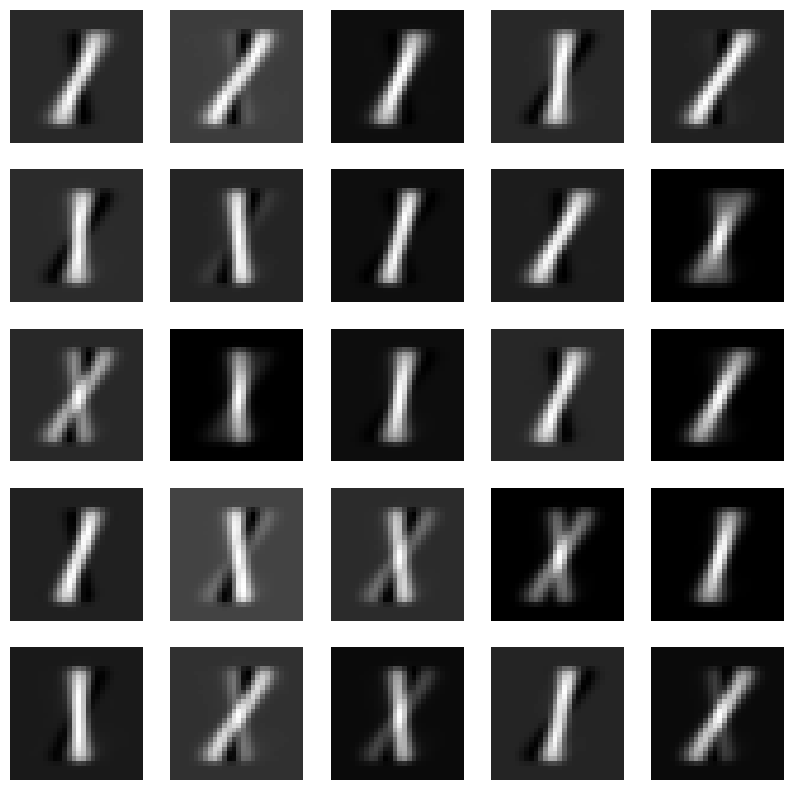

In [155]:
# Showing the original images of the highlighted points
num_imgs = 25
plt.figure(figsize=(10, 10))
for i, index in enumerate(highlighted_points[:num_imgs]):
    inverse_transformed_point = pca.inverse_transform(lbl_1_imgs_pca[index].reshape(1, -1))
    original_image = inverse_transformed_point.reshape((28, 28))
    plt.subplot(5, 5, i + 1)
    plt.imshow(original_image, cmap='gray')
    plt.axis('off')

plt.show()

### For label 2

In [156]:
# Flattening images
lbl_2_imgs = torch.stack(subsets[2], dim=0)
lbl_2_imgs = lbl_2_imgs.reshape(lbl_2_imgs.shape[0], -1)
print(lbl_2_imgs.shape)

torch.Size([5958, 784])


In [157]:
pca = PCA(n_components=2)
lbl_2_imgs_np = lbl_2_imgs.numpy()
lbl_2_imgs_pca = pca.fit_transform(lbl_2_imgs_np)
print(lbl_2_imgs_pca.shape)

(5958, 2)


/var/folders/tm/pvz0w3rn0vg96l962tm72tp40000gn/T/ipykernel_2445/2394787845.py:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(lbl_2_imgs_pca[:, 0], lbl_2_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)


Text(0.5, 1.0, 'PCA of Label 2 Images')

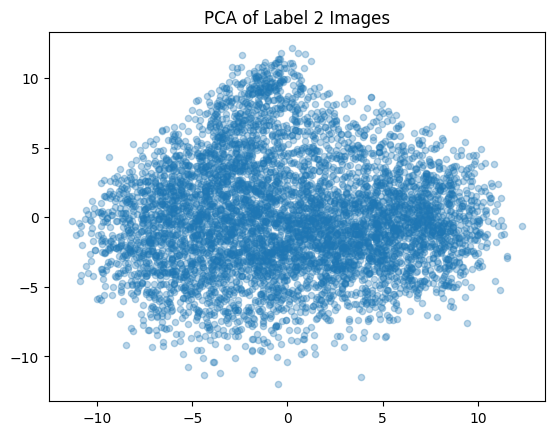

In [158]:
plt.scatter(lbl_2_imgs_pca[:, 0], lbl_2_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)
plt.title('PCA of Label 2 Images')

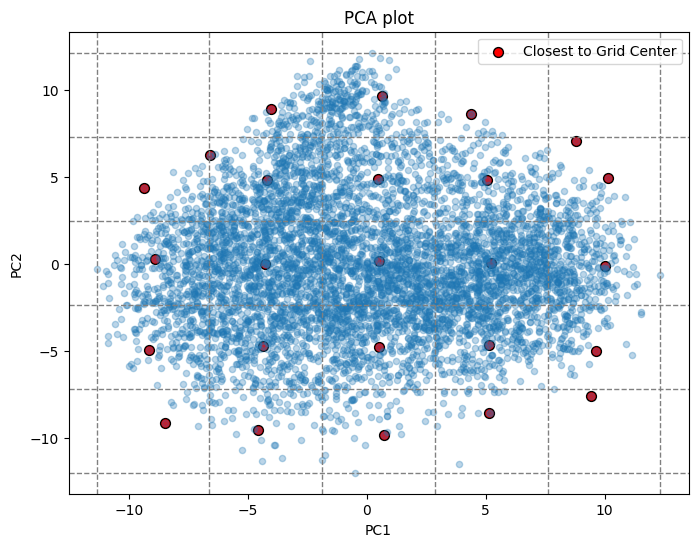

In [159]:
_, _, highlighted_points_2 = plot_grid_points(lbl_2_imgs_pca)

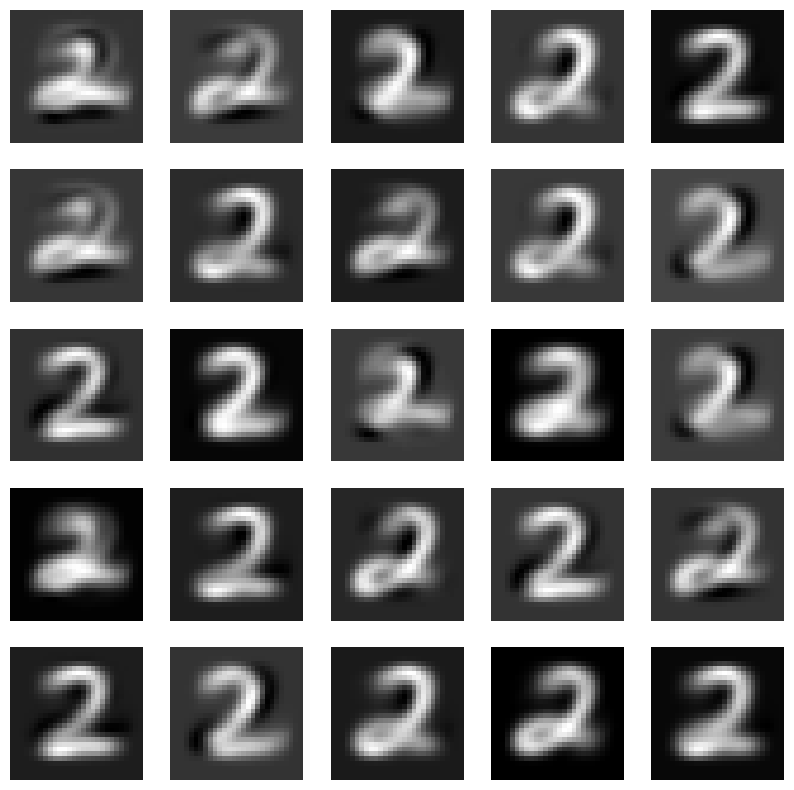

In [160]:
num_imgs = 25
plt.figure(figsize=(10, 10))
for i, index in enumerate(highlighted_points_2[:num_imgs]):
    inverse_transformed_point = pca.inverse_transform(lbl_2_imgs_pca[index].reshape(1, -1))
    original_image = inverse_transformed_point.reshape((28, 28))
    plt.subplot(5, 5, i + 1)
    plt.imshow(original_image, cmap='gray')
    plt.axis('off')

plt.show()

### For label 3

In [161]:
# Flattening images
lbl_3_imgs = torch.stack(subsets[3], dim=0)
lbl_3_imgs = lbl_3_imgs.reshape(lbl_3_imgs.shape[0], -1)
print(lbl_3_imgs.shape)

torch.Size([6131, 784])


In [162]:
pca = PCA(n_components=2)
lbl_3_imgs_np = lbl_3_imgs.numpy()
lbl_3_imgs_pca = pca.fit_transform(lbl_3_imgs_np)
print(lbl_3_imgs_pca.shape)

(6131, 2)


/var/folders/tm/pvz0w3rn0vg96l962tm72tp40000gn/T/ipykernel_2445/565588351.py:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(lbl_3_imgs_pca[:, 0], lbl_3_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)


Text(0.5, 1.0, 'PCA of Label 3 Images')

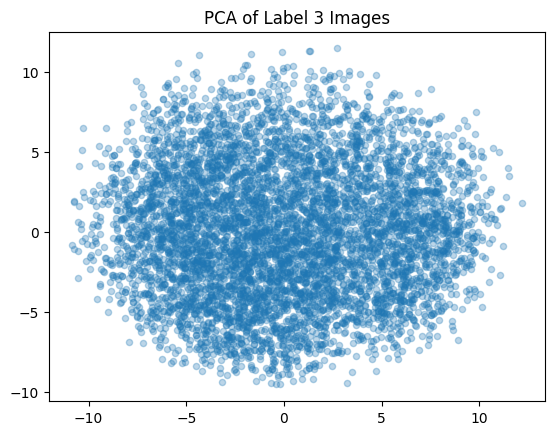

In [163]:
plt.scatter(lbl_3_imgs_pca[:, 0], lbl_3_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)
plt.title('PCA of Label 3 Images')

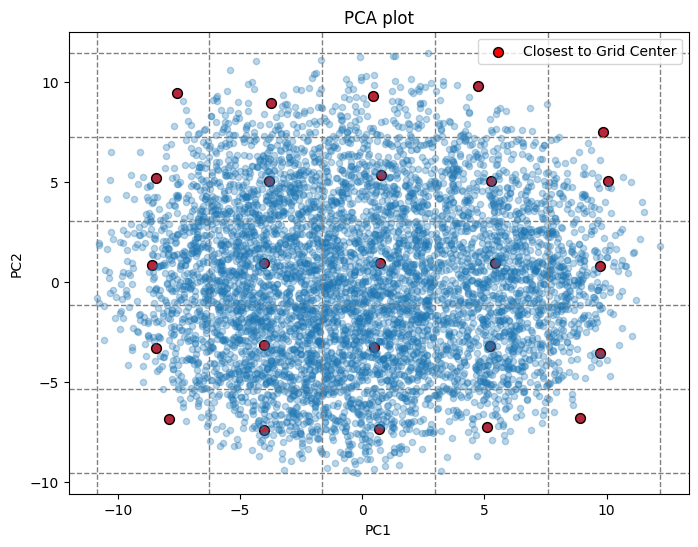

In [164]:
_, _, highlighted_points_3 = plot_grid_points(lbl_3_imgs_pca)

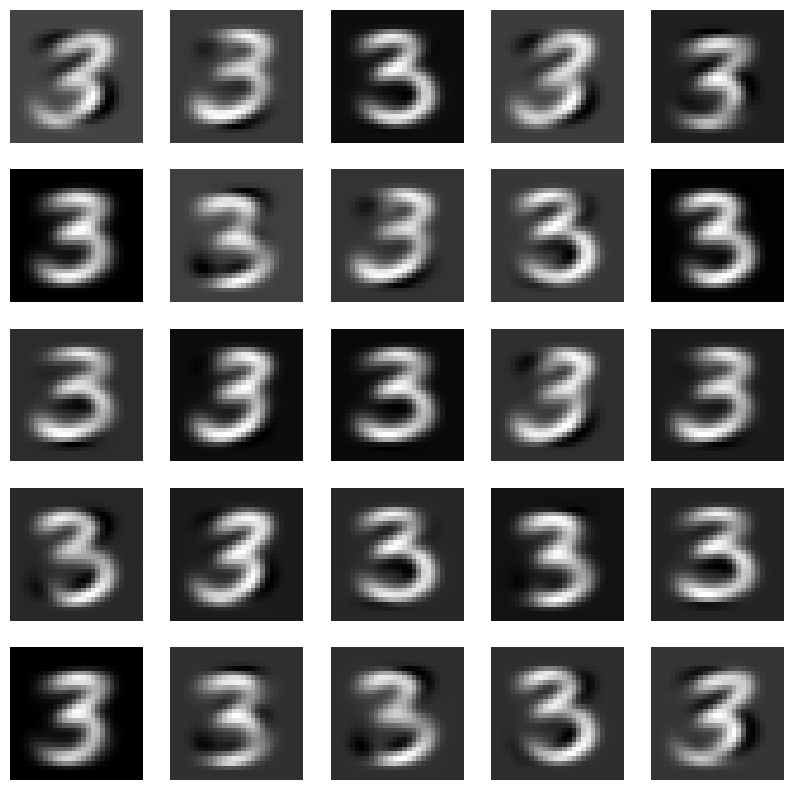

In [165]:
num_imgs = 25
plt.figure(figsize=(10, 10))
for i, index in enumerate(highlighted_points_3[:num_imgs]):
    inverse_transformed_point = pca.inverse_transform(lbl_3_imgs_pca[index].reshape(1, -1))
    original_image = inverse_transformed_point.reshape((28, 28))
    plt.subplot(5, 5, i + 1)
    plt.imshow(original_image, cmap='gray')
    plt.axis('off')

plt.show()

### For label 4

In [166]:
# Flattening images
lbl_4_imgs = torch.stack(subsets[4], dim=0)
lbl_4_imgs = lbl_4_imgs.reshape(lbl_4_imgs.shape[0], -1)
print(lbl_4_imgs.shape)

torch.Size([5842, 784])


In [167]:
pca = PCA(n_components=2)
lbl_4_imgs_np = lbl_4_imgs.numpy()
lbl_4_imgs_pca = pca.fit_transform(lbl_4_imgs_np)
print(lbl_4_imgs_pca.shape)

(5842, 2)


/var/folders/tm/pvz0w3rn0vg96l962tm72tp40000gn/T/ipykernel_2445/4132782887.py:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(lbl_4_imgs_pca[:, 0], lbl_4_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)


Text(0.5, 1.0, 'PCA of Label 4 Images')

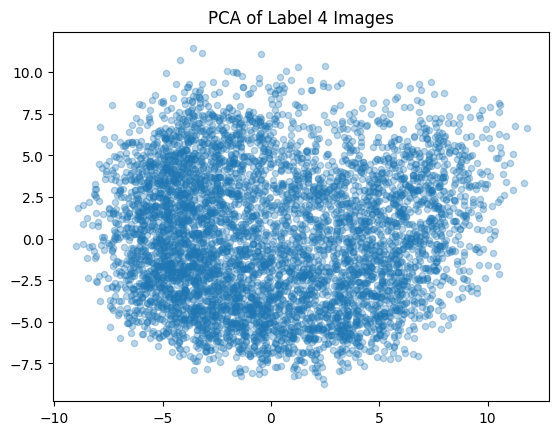

In [168]:
plt.scatter(lbl_4_imgs_pca[:, 0], lbl_4_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)
plt.title('PCA of Label 4 Images')

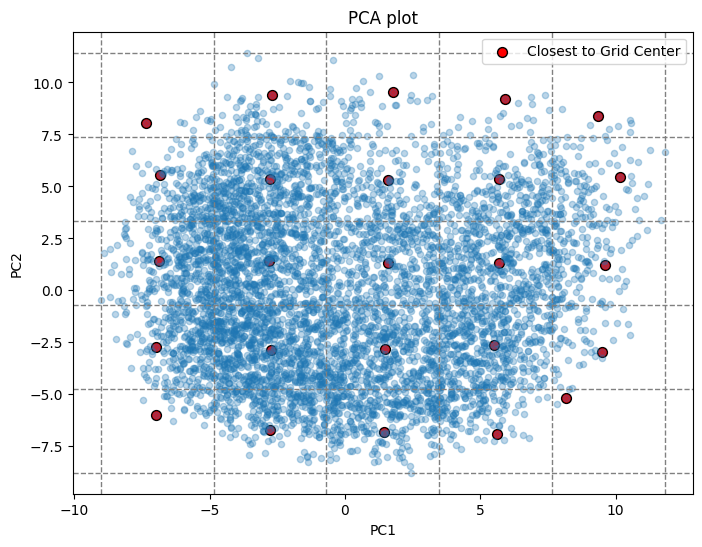

In [169]:
_, _, highlighted_points_4 = plot_grid_points(lbl_4_imgs_pca)

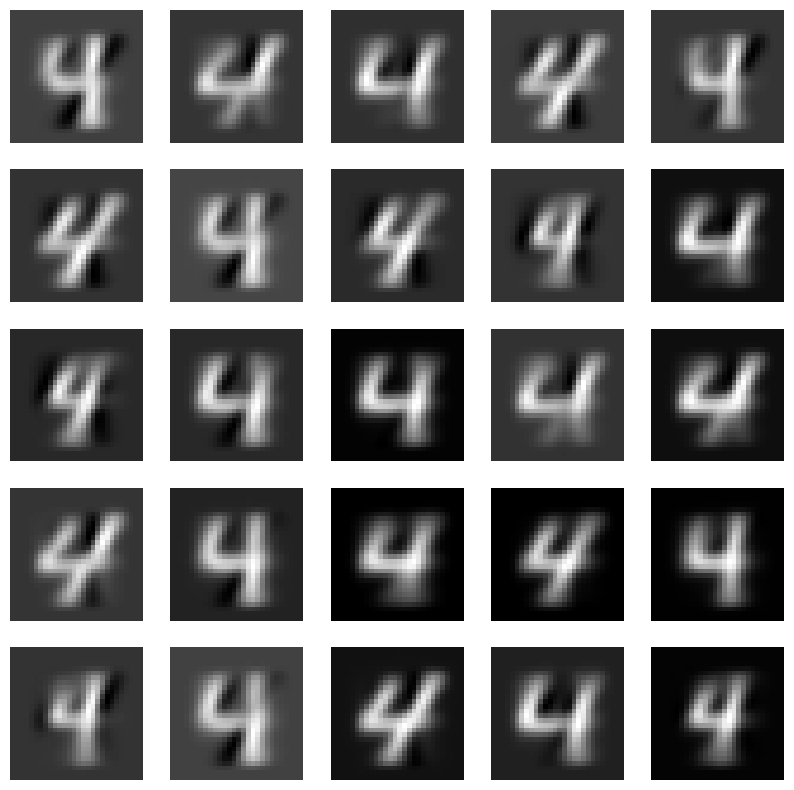

In [170]:
num_imgs = 25
plt.figure(figsize=(10, 10))
for i, index in enumerate(highlighted_points_4[:num_imgs]):
    inverse_transformed_point = pca.inverse_transform(lbl_4_imgs_pca[index].reshape(1, -1))
    original_image = inverse_transformed_point.reshape((28, 28))
    plt.subplot(5, 5, i + 1)
    plt.imshow(original_image, cmap='gray')
    plt.axis('off')

plt.show()

### For label 5

In [171]:
# Flattening images
lbl_5_imgs = torch.stack(subsets[5], dim=0)
lbl_5_imgs = lbl_5_imgs.reshape(lbl_5_imgs.shape[0], -1)
print(lbl_5_imgs.shape)

torch.Size([5421, 784])


In [172]:
pca = PCA(n_components=2)
lbl_5_imgs_np = lbl_5_imgs.numpy()
lbl_5_imgs_pca = pca.fit_transform(lbl_5_imgs_np)
print(lbl_5_imgs_pca.shape)

(5421, 2)


/var/folders/tm/pvz0w3rn0vg96l962tm72tp40000gn/T/ipykernel_2445/2474997260.py:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(lbl_5_imgs_pca[:, 0], lbl_5_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)


Text(0.5, 1.0, 'PCA of Label 5 Images')

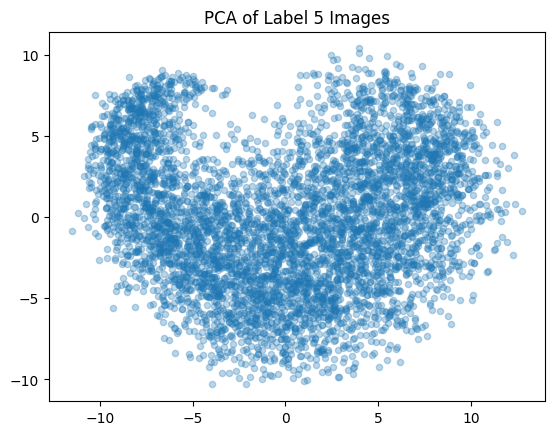

In [173]:
plt.scatter(lbl_5_imgs_pca[:, 0], lbl_5_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)
plt.title('PCA of Label 5 Images')

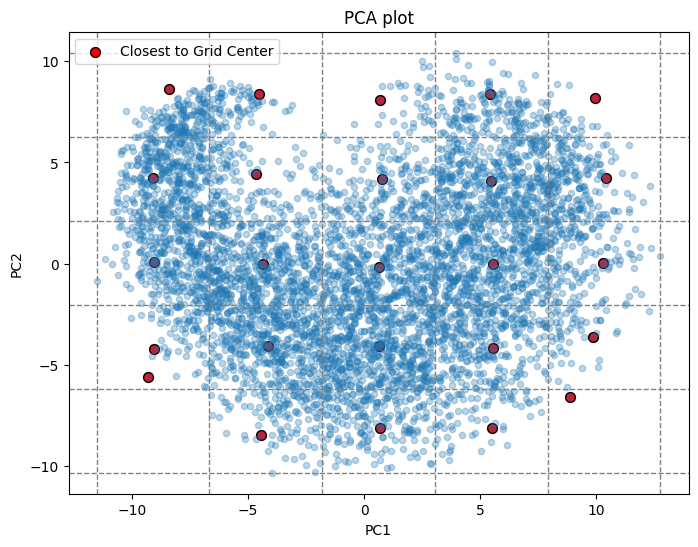

In [174]:
_, _, highlighted_points_5 = plot_grid_points(lbl_5_imgs_pca)

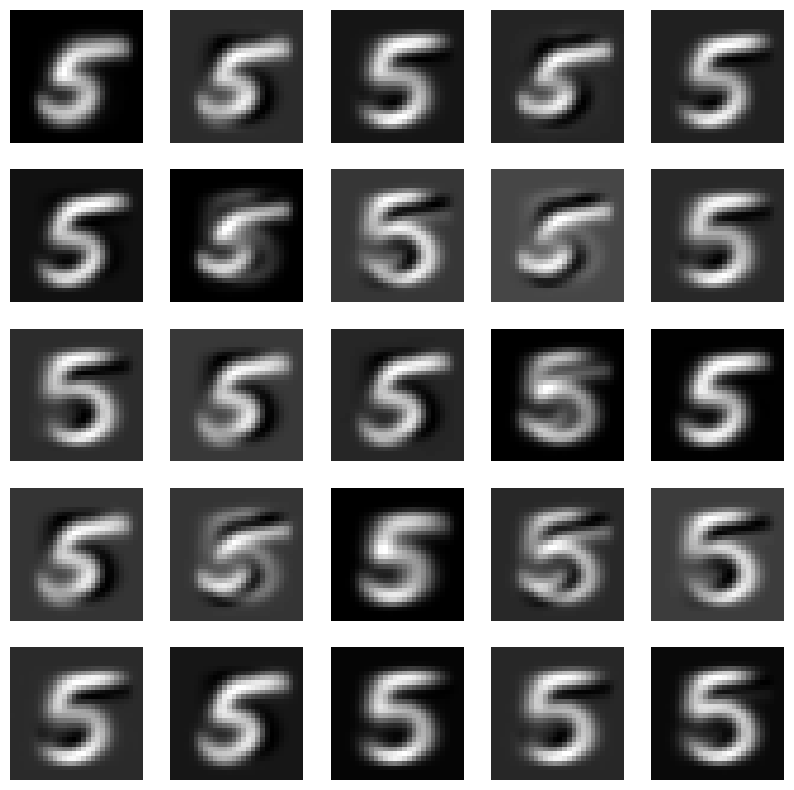

In [175]:
num_imgs = 25
plt.figure(figsize=(10, 10))
for i, index in enumerate(highlighted_points_5[:num_imgs]):
    inverse_transformed_point = pca.inverse_transform(lbl_5_imgs_pca[index].reshape(1, -1))
    original_image = inverse_transformed_point.reshape((28, 28))
    plt.subplot(5, 5, i + 1)
    plt.imshow(original_image, cmap='gray')
    plt.axis('off')

plt.show()

### For label 6

In [176]:
# Flattening images
lbl_6_imgs = torch.stack(subsets[6], dim=0)
lbl_6_imgs = lbl_6_imgs.reshape(lbl_6_imgs.shape[0], -1)
print(lbl_6_imgs.shape)

torch.Size([5918, 784])


In [177]:
pca = PCA(n_components=2)
lbl_6_imgs_np = lbl_6_imgs.numpy()
lbl_6_imgs_pca = pca.fit_transform(lbl_6_imgs_np)
print(lbl_6_imgs_pca.shape)

(5918, 2)


/var/folders/tm/pvz0w3rn0vg96l962tm72tp40000gn/T/ipykernel_2445/2604458096.py:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(lbl_6_imgs_pca[:, 0], lbl_6_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)


Text(0.5, 1.0, 'PCA of Label 6 Images')

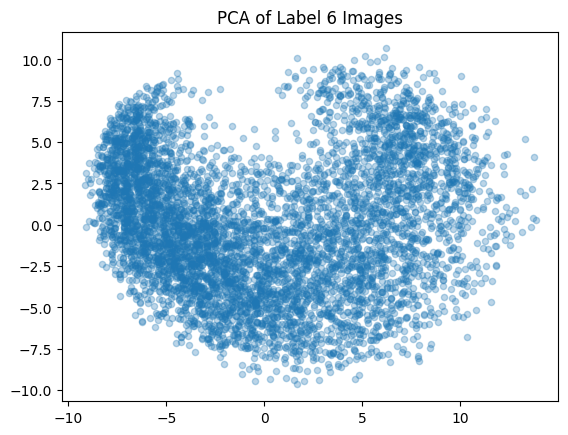

In [178]:
plt.scatter(lbl_6_imgs_pca[:, 0], lbl_6_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)
plt.title('PCA of Label 6 Images')

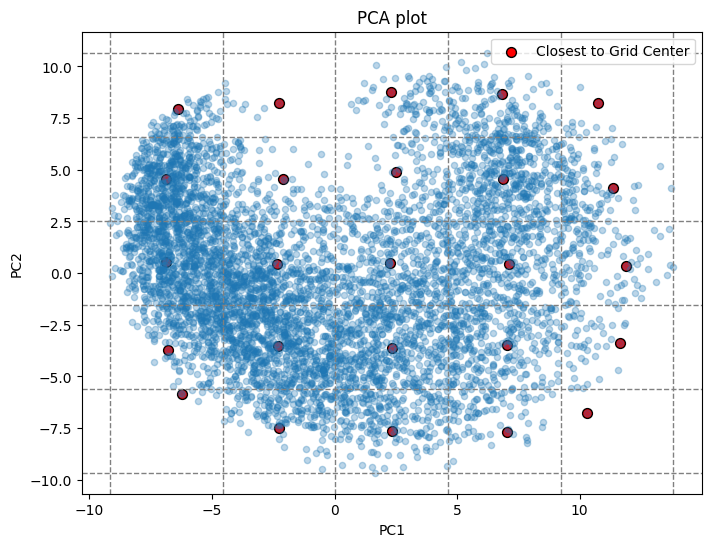

In [179]:
_, _, highlighted_points_6 = plot_grid_points(lbl_6_imgs_pca)

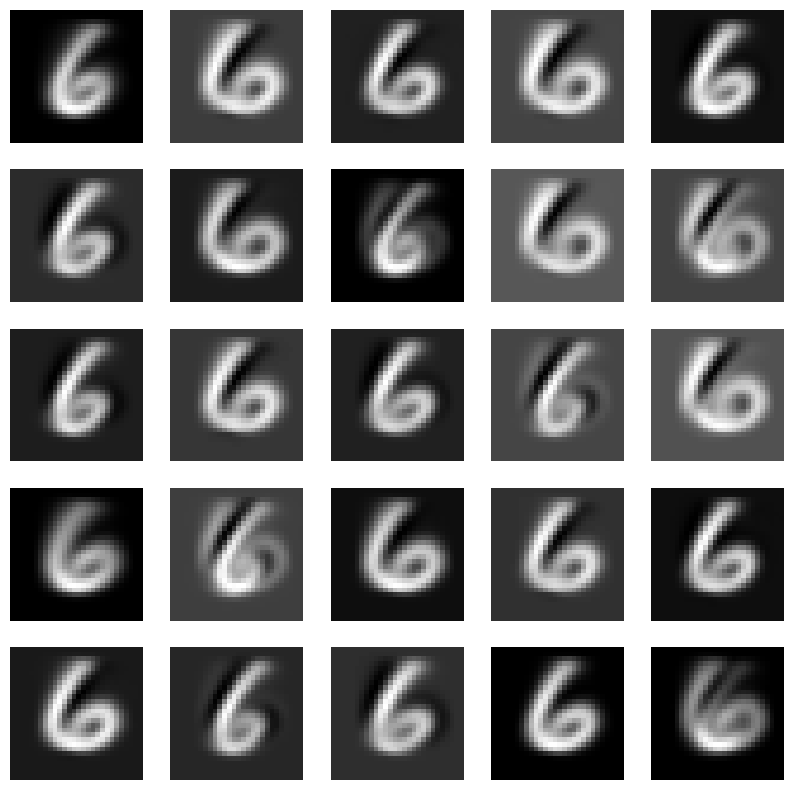

In [180]:
num_imgs = 25
plt.figure(figsize=(10, 10))
for i, index in enumerate(highlighted_points_6[:num_imgs]):
    inverse_transformed_point = pca.inverse_transform(lbl_6_imgs_pca[index].reshape(1, -1))
    original_image = inverse_transformed_point.reshape((28, 28))
    plt.subplot(5, 5, i + 1)
    plt.imshow(original_image, cmap='gray')
    plt.axis('off')

plt.show()

### For label 7

In [181]:
# Flattening images
lbl_7_imgs = torch.stack(subsets[7], dim=0)
lbl_7_imgs = lbl_7_imgs.reshape(lbl_7_imgs.shape[0], -1)
print(lbl_7_imgs.shape)

torch.Size([6265, 784])


In [182]:
pca = PCA(n_components=2)
lbl_7_imgs_np = lbl_7_imgs.numpy()
lbl_7_imgs_pca = pca.fit_transform(lbl_7_imgs_np)
print(lbl_7_imgs_pca.shape)

(6265, 2)


/var/folders/tm/pvz0w3rn0vg96l962tm72tp40000gn/T/ipykernel_2445/2112187897.py:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(lbl_7_imgs_pca[:, 0], lbl_7_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)


Text(0.5, 1.0, 'PCA of Label 7 Images')

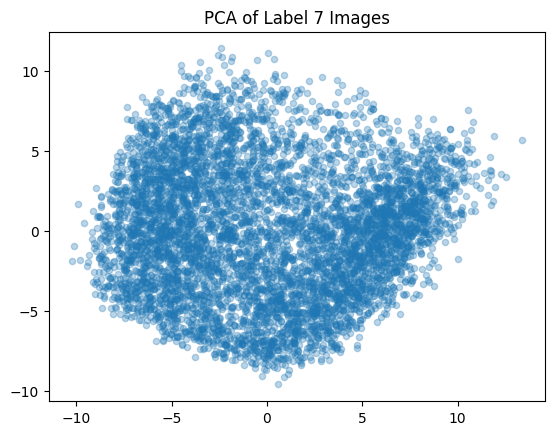

In [183]:
plt.scatter(lbl_7_imgs_pca[:, 0], lbl_7_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)
plt.title('PCA of Label 7 Images')

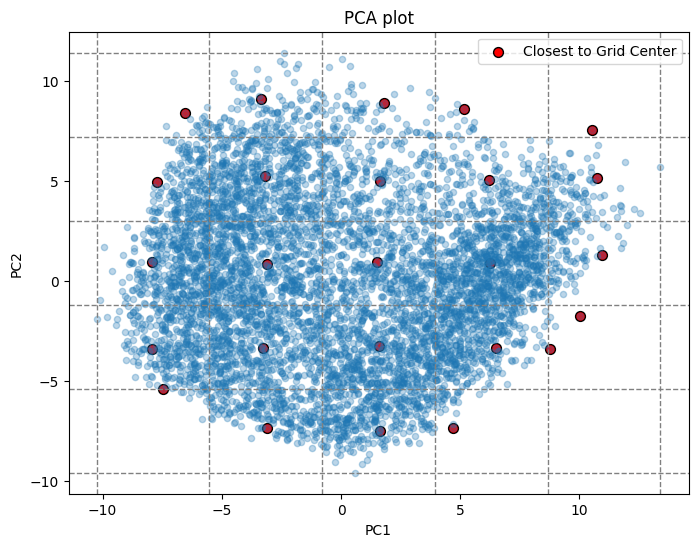

In [184]:
_, _, highlighted_points_7 = plot_grid_points(lbl_7_imgs_pca)

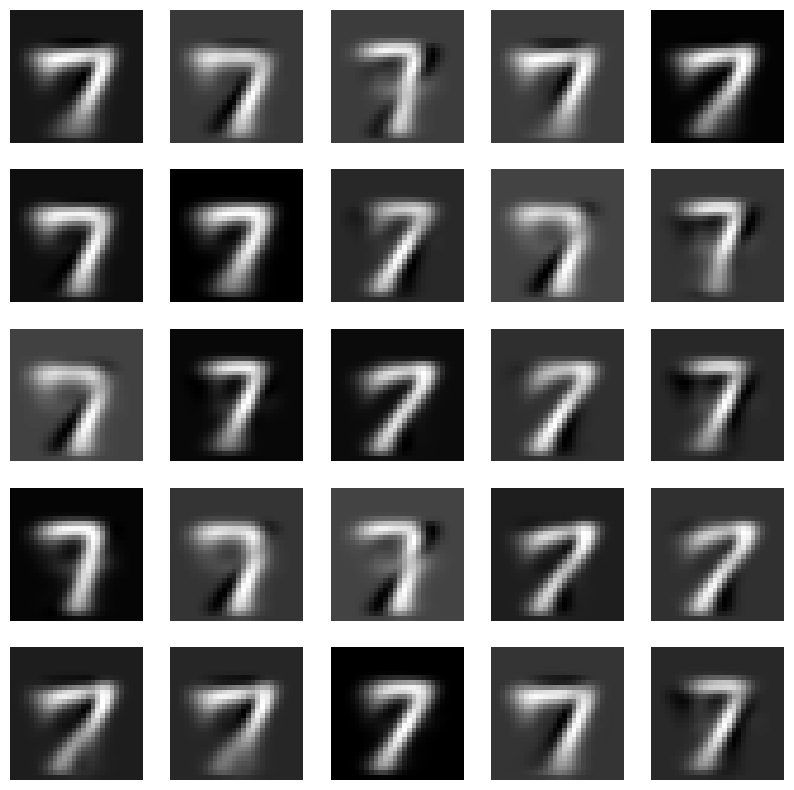

In [185]:
num_imgs = 25
plt.figure(figsize=(10, 10))
for i, index in enumerate(highlighted_points_7[:num_imgs]):
    inverse_transformed_point = pca.inverse_transform(lbl_7_imgs_pca[index].reshape(1, -1))
    original_image = inverse_transformed_point.reshape((28, 28))
    plt.subplot(5, 5, i + 1)
    plt.imshow(original_image, cmap='gray')
    plt.axis('off')

plt.show()

### For label 8

In [186]:
# Flattening images
lbl_8_imgs = torch.stack(subsets[8], dim=0)
lbl_8_imgs = lbl_8_imgs.reshape(lbl_8_imgs.shape[0], -1)
print(lbl_8_imgs.shape)

torch.Size([5851, 784])


In [187]:
pca = PCA(n_components=2)
lbl_8_imgs_np = lbl_8_imgs.numpy()
lbl_8_imgs_pca = pca.fit_transform(lbl_8_imgs_np)
print(lbl_8_imgs_pca.shape)

(5851, 2)


/var/folders/tm/pvz0w3rn0vg96l962tm72tp40000gn/T/ipykernel_2445/1877425104.py:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(lbl_8_imgs_pca[:, 0], lbl_8_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)


Text(0.5, 1.0, 'PCA of Label 8 Images')

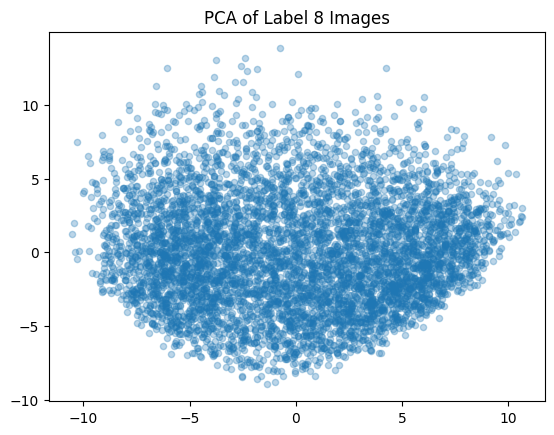

In [188]:
plt.scatter(lbl_8_imgs_pca[:, 0], lbl_8_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)
plt.title('PCA of Label 8 Images')

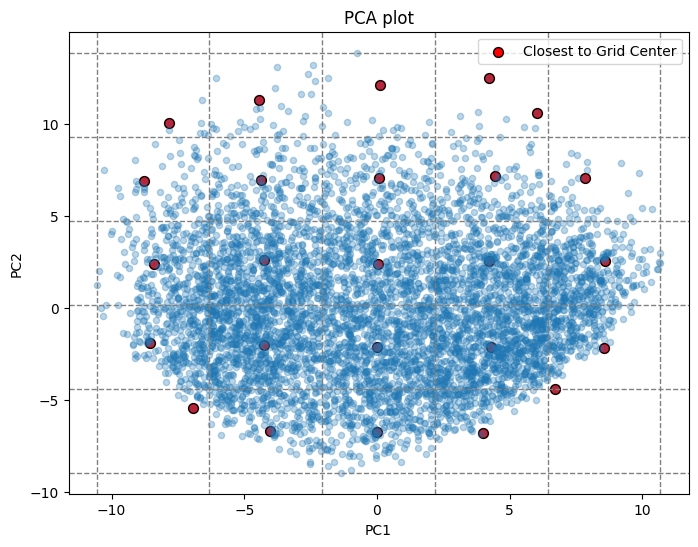

In [189]:
_, _, highlighted_points_8 = plot_grid_points(lbl_8_imgs_pca)

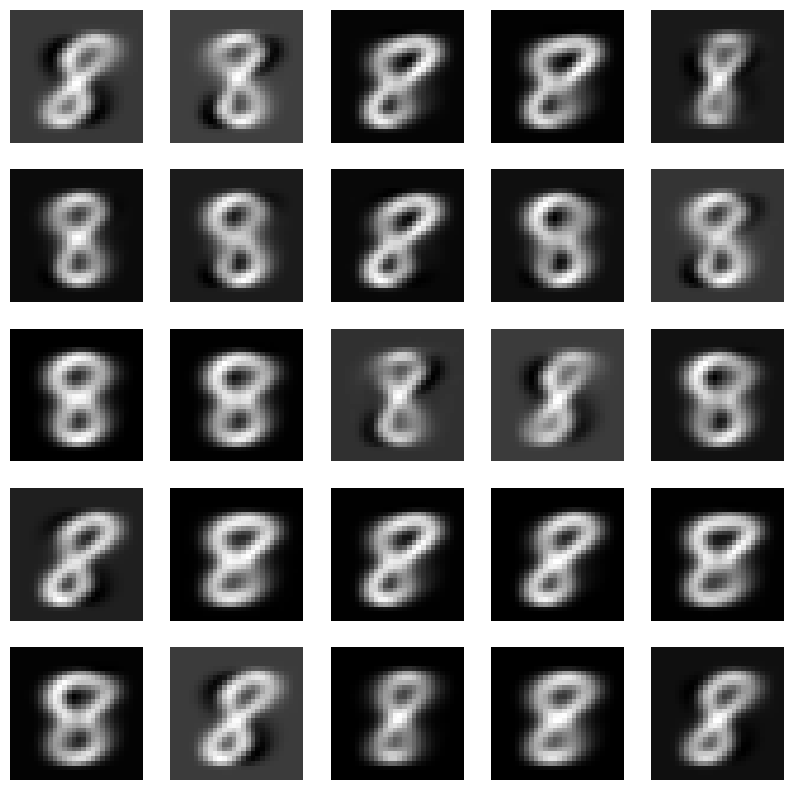

In [190]:
num_imgs = 25
plt.figure(figsize=(10, 10))
for i, index in enumerate(highlighted_points_8[:num_imgs]):
    inverse_transformed_point = pca.inverse_transform(lbl_8_imgs_pca[index].reshape(1, -1))
    original_image = inverse_transformed_point.reshape((28, 28))
    plt.subplot(5, 5, i + 1)
    plt.imshow(original_image, cmap='gray')
    plt.axis('off')

plt.show()

In [191]:
# Flattening images
lbl_9_imgs = torch.stack(subsets[9], dim=0)
lbl_9_imgs = lbl_9_imgs.reshape(lbl_9_imgs.shape[0], -1)
print(lbl_9_imgs.shape)

torch.Size([5949, 784])


In [192]:
pca = PCA(n_components=2)
lbl_9_imgs_np = lbl_9_imgs.numpy()
lbl_9_imgs_pca = pca.fit_transform(lbl_9_imgs_np)
print(lbl_9_imgs_pca.shape)

(5949, 2)


/var/folders/tm/pvz0w3rn0vg96l962tm72tp40000gn/T/ipykernel_2445/2650655574.py:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(lbl_9_imgs_pca[:, 0], lbl_9_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)


Text(0.5, 1.0, 'PCA of Label 9 Images')

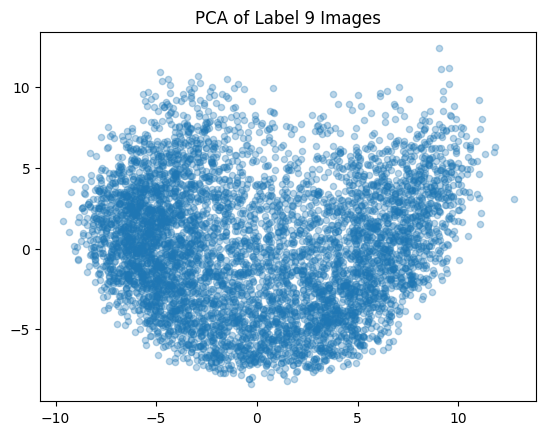

In [193]:
plt.scatter(lbl_9_imgs_pca[:, 0], lbl_9_imgs_pca[:, 1], s=20, cmap='viridis', alpha=0.3)
plt.title('PCA of Label 9 Images')

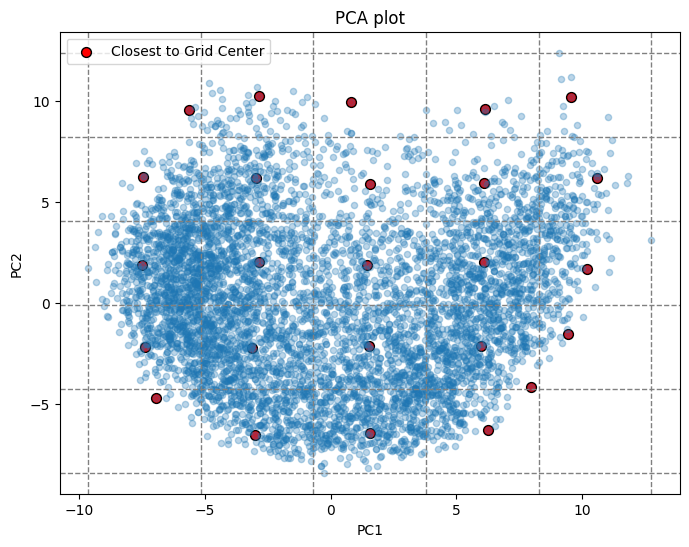

In [194]:
_, _, highlighted_points_9 = plot_grid_points(lbl_9_imgs_pca)

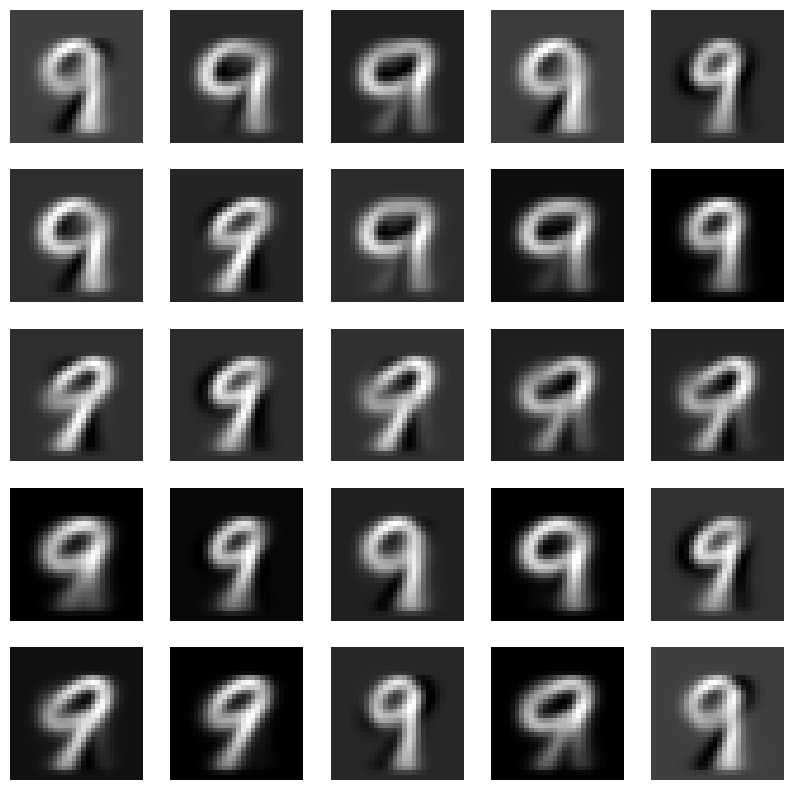

In [195]:
num_imgs = 25
plt.figure(figsize=(10, 10))
for i, index in enumerate(highlighted_points_9[:num_imgs]):
    inverse_transformed_point = pca.inverse_transform(lbl_9_imgs_pca[index].reshape(1, -1))
    original_image = inverse_transformed_point.reshape((28, 28))
    plt.subplot(5, 5, i + 1)
    plt.imshow(original_image, cmap='gray')
    plt.axis('off')

plt.show()

### **3. PCA on gene expression data**

In [24]:
# Loading data

lbls = pd.read_csv("/Users/amirebrahimi/Documents/ML02-03/HW2/expression_data/Leaf_Root_annotation.csv")
raw_df = pd.read_csv("/Users/amirebrahimi/Documents/ML02-03/HW2/expression_data/Leaf_Root_raw_data.csv")
norm_df = pd.read_csv("/Users/amirebrahimi/Documents/ML02-03/HW2/expression_data/Leaf_Root_normalized_data.csv")

#### For Raw expression matrix

In [3]:
raw_df = raw_df.drop("Unnamed: 0", axis=1)
raw_mtx = raw_df.values
raw_mtx = raw_mtx.transpose()  # To have shape (num_samples, num_genes)
print(raw_mtx.shape)

(26, 44770)


In [4]:
# Kmeans with 2 clusters
km_raw2 = KMeans(n_clusters=2,
                 init="k-means++",
                 n_init=300,
                 random_state=1)

y_raw2 = km_raw2.fit_predict(raw_mtx)

In [5]:
# Kmeans with 2 clusters
km_raw3 = KMeans(n_clusters=3,
                 init="k-means++",
                 n_init=300,
                 random_state=1)

y_raw3 = km_raw3.fit_predict(raw_mtx)

In [6]:
y_raw2  # Cluster labels

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1,
       1, 0, 0, 0], dtype=int32)

In [7]:
tissue_lbls = np.where(lbls["Tissue"].values=="Leaf", 0, 1)
print(tissue_lbls)

[0 0 0 0 1 1 1 1 0 1 0 0 1 1 1 1 1 0 0 0 0 0 0 1 1 1]


In [8]:
y_raw3

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1,
       1, 2, 2, 2], dtype=int32)

In [9]:
conditions = [
    lbls["Project"].values=="PRJNA493167",
    lbls["Project"].values=="PRJNA661543",
    lbls["Project"].values=="PRJNA730337"
]
choices = [0, 1, 2]
proj_lbls = np.select(conditions, choices)
print(proj_lbls)

[0 0 0 0 0 0 0 0 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2]


For raw data, kmeans with 3 clusters shows better clustering which can be related to the three projects ```PRJNA493167```, ```PRJNA661543```, and ```PRJNA730337```. Data are not clustered well based on kmeans with 2 clusters.

In [10]:
from sklearn.decomposition import PCA

raw_pca = PCA(n_components=10)
raw_pca_ = raw_pca.fit_transform(raw_mtx)
print(raw_pca_.shape)

(26, 10)


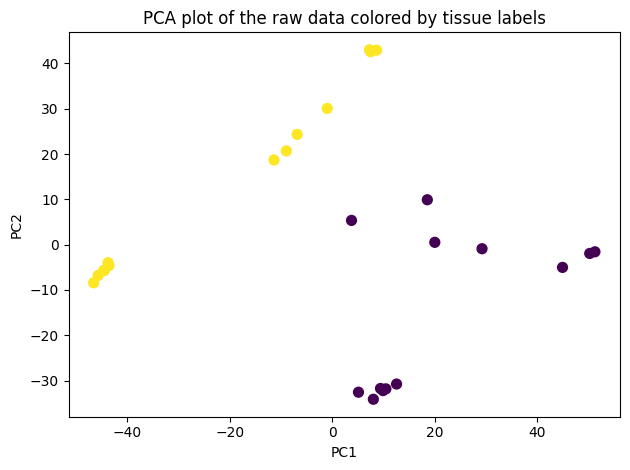

In [11]:
plt.scatter(raw_pca_[:, 0], raw_pca_[:, 1], c=tissue_lbls, cmap="viridis", s=50)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA plot of the raw data colored by tissue labels")
plt.tight_layout()
plt.show()

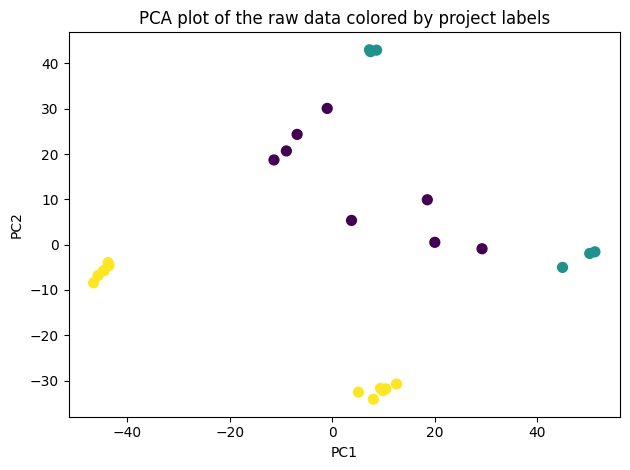

In [12]:
plt.scatter(raw_pca_[:, 0], raw_pca_[:, 1], c=proj_lbls, cmap="viridis", s=50)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA plot of the raw data colored by project labels")
plt.tight_layout()
plt.show()

#### For normalized expression matrix

In [25]:
norm_df = norm_df.drop("Unnamed: 0", axis=1)
norm_mtx = norm_df.values
norm_mtx = norm_mtx.transpose()  # To have shape (num_samples, num_genes)
print(norm_mtx.shape)

(26, 44770)


In [26]:
# Kmeans with 2 clusters
km_norm2 = KMeans(n_clusters=2,
                 init="k-means++",
                 n_init=300,
                 random_state=1)

y_norm2 = km_norm2.fit_predict(norm_mtx)

In [27]:
# Kmeans with 3 clusters
km_norm3 = KMeans(n_clusters=3,
                 init="k-means++",
                 n_init=300,
                 random_state=1)

y_norm3 = km_norm3.fit_predict(norm_mtx)

In [28]:
print(y_norm2)

[0 0 0 0 1 1 1 1 0 1 0 0 1 1 1 1 1 0 0 0 0 0 0 1 1 1]


In [29]:
print(tissue_lbls)

[0 0 0 0 1 1 1 1 0 1 0 0 1 1 1 1 1 0 0 0 0 0 0 1 1 1]


In [30]:
print(y_norm3)

[1 1 1 1 0 0 0 0 1 0 1 1 0 0 2 2 2 1 1 1 1 1 1 2 2 2]


In [31]:
print(proj_lbls)

[0 0 0 0 0 0 0 0 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2]


In [32]:
norm_pca = PCA(n_components=10)
norm_pca_ = norm_pca.fit_transform(norm_mtx)
print(norm_pca_.shape)

(26, 10)


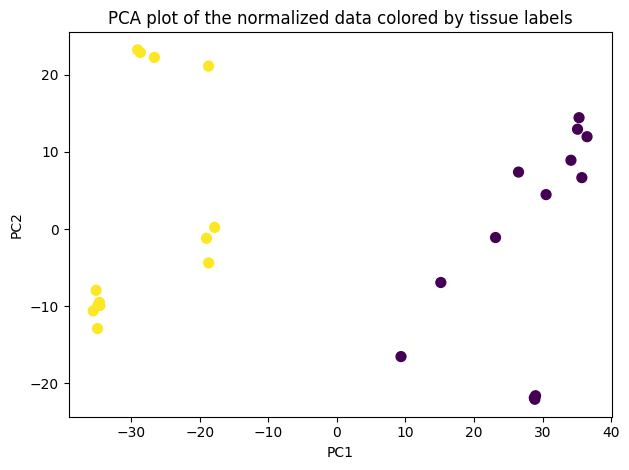

In [33]:
plt.scatter(norm_pca_[:, 0], norm_pca_[:, 1], c=tissue_lbls, cmap="viridis", s=50)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA plot of the normalized data colored by tissue labels")
plt.tight_layout()
plt.show()

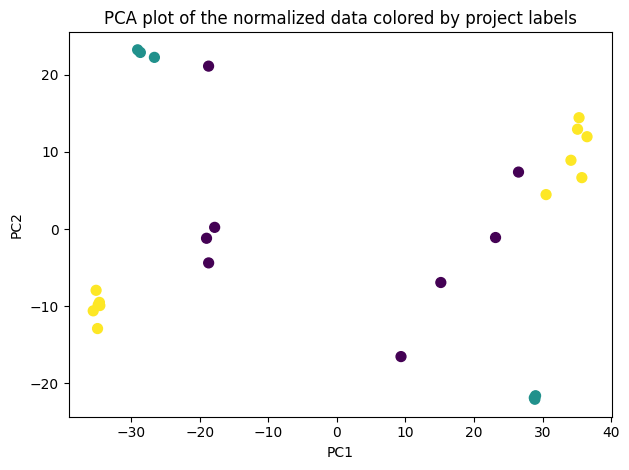

In [34]:
plt.scatter(norm_pca_[:, 0], norm_pca_[:, 1], c=proj_lbls, cmap="viridis", s=50)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA plot of the normalized data colored by project labels")
plt.tight_layout()
plt.show()

The results show that normalized data clustered better based on tissues(two clusters) and the project batches did not have significant effect on the clustering of normalized data. This has been expected since the normalized data was batch-corrected. 

To sum up, normalized data showed better clustering based on tissue labels compared to the raw data. Also, the raw data demonstrated the batch effect in PCA embeddings while this batch effect has been overcome in the normalized data.

Additionally, PCA embedding resulted in more meaningful clusterings in both raw and normalized data due to the ability of PCA to project the large number of gene features into a low-dimensional space where features are less correlated and curse of dimensionality can be overcomed. 

### **4. Classification on MNIST dataset**

In [3]:
# Data
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
mnist_train = datasets.MNIST(root="/Users/amirebrahimi/Documents/ML02-03/HW2/mnist_data", 
                             train=True, transform=transform, download=False)
mnist_test = datasets.MNIST(root="/Users/amirebrahimi/Documents/ML02-03/HW2/mnist_data", 
                            train=False, transform=transform, download=False)

In [4]:
print(len(mnist_train))
print(len(mnist_test))

60000
10000


#### a. Logistic Regression

In [7]:
train_loader_ = DataLoader(mnist_train, batch_size=60000)
test_loader_ = DataLoader(mnist_test, batch_size=10000)
train_iter = iter(train_loader_)
test_iter = iter(test_loader_)
imgs, lbls = next(train_iter)
test_imgs, test_lbls = next(test_iter)
imgs = imgs.numpy().squeeze()
lbls = lbls.numpy()
test_imgs = test_imgs.numpy().squeeze()
test_lbls = test_lbls.numpy()
print(f"Train data shape: {imgs.shape} and train labels shape: {lbls.shape}")
print(f"Test data shape: {test_imgs.shape} and test labels shape: {test_lbls.shape}")

Train data shape: (60000, 28, 28) and train labels shape: (60000,)
Test data shape: (10000, 28, 28) and test labels shape: (10000,)


In [8]:
# Flattening images
imgs = imgs.reshape(-1, 28*28)
test_imgs = test_imgs.reshape(-1, 28*28)
print(imgs.shape)
print(test_imgs.shape)

(60000, 784)
(10000, 784)


In [9]:
from sklearn.linear_model import LogisticRegression

logreg_ = LogisticRegression()
logreg_.fit(imgs, lbls)
y_pred = logreg_.predict(test_imgs)

/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [10]:
from sklearn.metrics import accuracy_score

logreg_accuracy = accuracy_score(test_lbls, y_pred)
print(f"The logistic regression accuracy is :{logreg_accuracy}")

The logistic regression accuracy is :0.9225


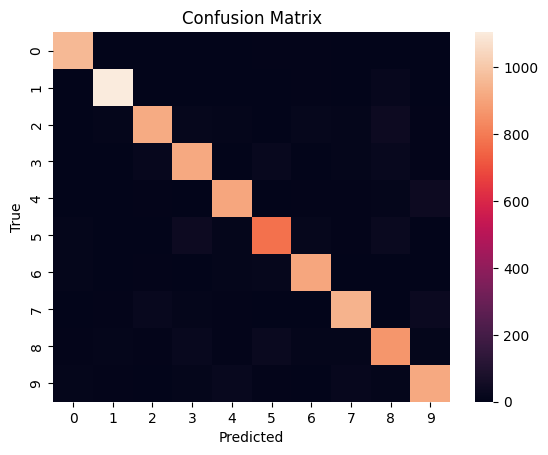

In [74]:
# Confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

cfm = confusion_matrix(test_lbls, y_pred)
sns.heatmap(cfm, fmt="d")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

#### b. MLP with one hidden layer

In [8]:
batch_size = 64
train_loader = DataLoader(mnist_train, batch_size)
test_loader = DataLoader(mnist_test, batch_size)

In [5]:
import torch.nn as nn 
import torch.optim as optim

In [19]:
# Model
class MLPb(nn.Module):
    def __init__(self, in_dim, hidden_dim, num_classes):
        super(MLPb, self).__init__()
        self.in_dim = in_dim
        self.hidden_dim = hidden_dim
        self.num_classes = num_classes

        self.hidden = nn.Linear(in_dim, hidden_dim)
        self.out = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        x = x.view(-1, self.in_dim)
        h = self.hidden(x)
        pred = self.out(h)
        return pred


In [38]:
# Hyperparameters
in_dim = 28 * 28
hidden_dim = 128
num_classes = 10
mlpb = MLPb(in_dim, hidden_dim, num_classes)
optimizer = optim.SGD(mlpb.parameters(), lr=1e-2)
ce_loss = nn.CrossEntropyLoss()
epochs = 50

In [6]:
# Training
class Trainer():
    def __init__(self, train_set, model,
                 loss, optimizer, num_epochs):
        self.train_set = train_set
        self.model = model
        self.loss = loss
        self.optimizer = optimizer
        self.num_epochs = num_epochs

    def train(self):
        self.model.train()
        train_loss = []
        for epoch in range(self.num_epochs):
            epoch_loss = 0.0
            total_samples = 0
            for imgs, lbls in self.train_set:
                pred = self.model(imgs)
                batch_loss = self.loss(pred, lbls)
                self.optimizer.zero_grad()
                batch_loss.backward()
                self.optimizer.step()
                epoch_loss += batch_loss.item() * imgs.size(0)
                total_samples += imgs.size(0)
            
            epoch_loss /= total_samples
            print(f"Epoch: {epoch+1} | Loss: {epoch_loss:.4f}")
            train_loss.append(epoch_loss)

        return train_loss

    def plot_loss(self, training_loss:list):
        epoch_range = np.arange(1, self.num_epochs + 1)
        plt.plot(epoch_range, training_loss, label="Training Loss")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.title("Training Loss over Epochs")
        plt.legend()
        plt.tight_layout()
        plt.show()

In [79]:
trainer = Trainer(train_loader, mlpb, ce_loss, optimizer, epochs)
train_loss = trainer.train()

Epoch: 1 | Loss: 0.2436
Epoch: 2 | Loss: 0.2435
Epoch: 3 | Loss: 0.2433
Epoch: 4 | Loss: 0.2432
Epoch: 5 | Loss: 0.2431
Epoch: 6 | Loss: 0.2429
Epoch: 7 | Loss: 0.2428
Epoch: 8 | Loss: 0.2427
Epoch: 9 | Loss: 0.2425
Epoch: 10 | Loss: 0.2424
Epoch: 11 | Loss: 0.2423
Epoch: 12 | Loss: 0.2422
Epoch: 13 | Loss: 0.2420
Epoch: 14 | Loss: 0.2419
Epoch: 15 | Loss: 0.2418
Epoch: 16 | Loss: 0.2417
Epoch: 17 | Loss: 0.2416
Epoch: 18 | Loss: 0.2414
Epoch: 19 | Loss: 0.2413
Epoch: 20 | Loss: 0.2412
Epoch: 21 | Loss: 0.2411
Epoch: 22 | Loss: 0.2410
Epoch: 23 | Loss: 0.2409
Epoch: 24 | Loss: 0.2408
Epoch: 25 | Loss: 0.2407
Epoch: 26 | Loss: 0.2406
Epoch: 27 | Loss: 0.2405
Epoch: 28 | Loss: 0.2404
Epoch: 29 | Loss: 0.2403
Epoch: 30 | Loss: 0.2402
Epoch: 31 | Loss: 0.2401
Epoch: 32 | Loss: 0.2400
Epoch: 33 | Loss: 0.2399
Epoch: 34 | Loss: 0.2398
Epoch: 35 | Loss: 0.2397
Epoch: 36 | Loss: 0.2396
Epoch: 37 | Loss: 0.2395
Epoch: 38 | Loss: 0.2394
Epoch: 39 | Loss: 0.2393
Epoch: 40 | Loss: 0.2392
Epoch: 41

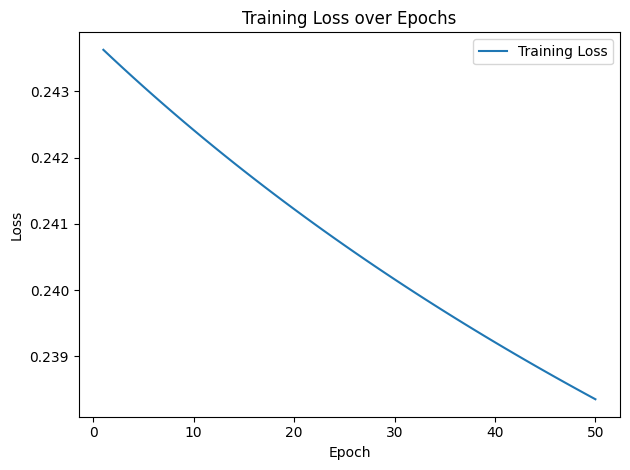

In [80]:
trainer.plot_loss(train_loss)

In [7]:
# Evaluation
class Evaluator(nn.Module):
    def __init__(self, test_set, model, loss):
        super(Evaluator, self).__init__()

        self.test_set = test_set
        self.model = model
        self.loss = loss

    def evaluate(self):
        self.model.eval()
        total_accuracy = 0.0
        total_loss = 0.0
        total_samples = 0
        with torch.no_grad():
            for imgs, lbls in self.test_set:
                preds = self.model(imgs)
                batch_loss = self.loss(preds, lbls)

                preds = torch.argmax(preds, dim=1)
                accuracy = accuracy_score(lbls.numpy(), 
                                          preds.numpy())

                total_accuracy += accuracy * imgs.size(0)
                total_loss += batch_loss.item() * imgs.size(0)
                total_samples += imgs.size(0)

        mean_accuracy = total_accuracy / total_samples
        mean_loss = total_loss / total_samples

        return mean_accuracy, mean_loss
    
    def plot_confusion(self):
        all_preds = []
        all_lbls = []

        with torch.no_grad():
            for imgs, lbls in self.test_set:
                preds = self.model(imgs)
                preds = torch.argmax(preds, dim=1)

                all_preds.extend(preds.cpu().numpy())
                all_lbls.extend(lbls.cpu().numpy())

        cfm = confusion_matrix(all_lbls, all_preds)
        sns.heatmap(cfm, fmt="d")
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.title("Confusion Matrix")
        plt.show()

In [82]:
evaluator = Evaluator(test_loader, mlpb, ce_loss)
mean_acc, mean_loss = evaluator.evaluate()
print(f"The average test accuracy: {mean_acc}")
print(f"The average test loss: {mean_loss:.4f}")

The average test accuracy: 0.9204
The average test loss: 0.2785


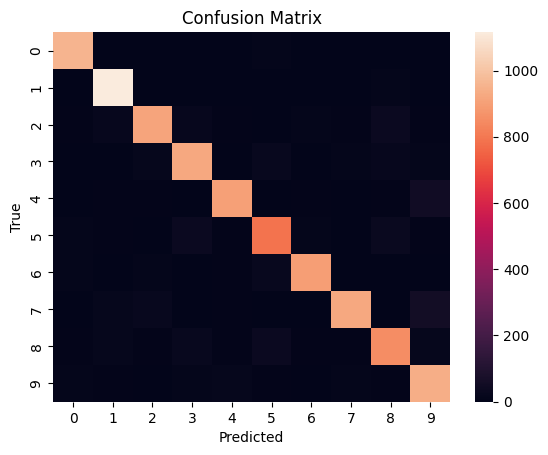

In [83]:
evaluator.plot_confusion()

#### c. MLP with two hidden layers

In [88]:
class MLPc(nn.Module):
    def __init__(self, in_dim, hidden_dim1, hidden_dim2, num_classes):
        super(MLPc, self).__init__()
        self.in_dim = in_dim
        self.hidden_dim1 = hidden_dim1
        self.hidden_dim2 = hidden_dim2
        self.num_classes = num_classes

        self.hidden1 = nn.Linear(self.in_dim, self.hidden_dim1)
        self.hidden2 = nn.Linear(self.hidden_dim1, self.hidden_dim2)
        self.out = nn.Linear(self.hidden_dim2, self.num_classes)

    def forward(self, x):
        x = x.view(-1, self.in_dim)
        h1 = self.hidden1(x)
        h2 = self.hidden2(h1)
        pred = self.out(h2)
        return pred


In [92]:
# Hyperparameters
in_dim = 28 * 28
hidden_dim1 = 256
hidden_dim2 = 128
num_classes = 10
mlpc = MLPc(in_dim, hidden_dim1, hidden_dim2, num_classes)
optimizer = optim.SGD(mlpc.parameters(), lr=1e-2)
ce_loss = nn.CrossEntropyLoss()
epochs = 50

In [93]:
trainer = Trainer(train_loader, mlpc, ce_loss, optimizer, epochs)
train_loss = trainer.train()

Epoch: 1 | Loss: 0.7513
Epoch: 2 | Loss: 0.3617
Epoch: 3 | Loss: 0.3269
Epoch: 4 | Loss: 0.3118
Epoch: 5 | Loss: 0.3028
Epoch: 6 | Loss: 0.2965
Epoch: 7 | Loss: 0.2918
Epoch: 8 | Loss: 0.2880
Epoch: 9 | Loss: 0.2849
Epoch: 10 | Loss: 0.2822
Epoch: 11 | Loss: 0.2798
Epoch: 12 | Loss: 0.2778
Epoch: 13 | Loss: 0.2759
Epoch: 14 | Loss: 0.2742
Epoch: 15 | Loss: 0.2727
Epoch: 16 | Loss: 0.2714
Epoch: 17 | Loss: 0.2701
Epoch: 18 | Loss: 0.2689
Epoch: 19 | Loss: 0.2679
Epoch: 20 | Loss: 0.2668
Epoch: 21 | Loss: 0.2659
Epoch: 22 | Loss: 0.2650
Epoch: 23 | Loss: 0.2642
Epoch: 24 | Loss: 0.2634
Epoch: 25 | Loss: 0.2627
Epoch: 26 | Loss: 0.2620
Epoch: 27 | Loss: 0.2613
Epoch: 28 | Loss: 0.2607
Epoch: 29 | Loss: 0.2601
Epoch: 30 | Loss: 0.2595
Epoch: 31 | Loss: 0.2590
Epoch: 32 | Loss: 0.2585
Epoch: 33 | Loss: 0.2580
Epoch: 34 | Loss: 0.2575
Epoch: 35 | Loss: 0.2570
Epoch: 36 | Loss: 0.2566
Epoch: 37 | Loss: 0.2561
Epoch: 38 | Loss: 0.2557
Epoch: 39 | Loss: 0.2553
Epoch: 40 | Loss: 0.2549
Epoch: 41

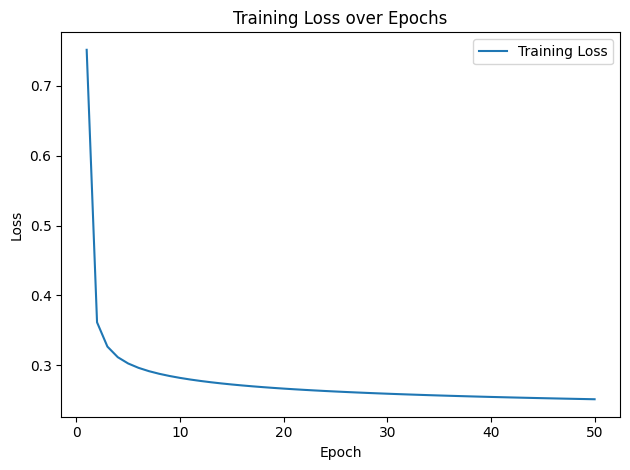

In [94]:
trainer.plot_loss(train_loss)

In [95]:
evaluator = Evaluator(test_loader, mlpc, ce_loss)
mean_acc, mean_loss = evaluator.evaluate()
print(f"The average test accuracy: {mean_acc}")
print(f"The average test loss: {mean_loss:.4f}")

The average test accuracy: 0.9197
The average test loss: 0.2782


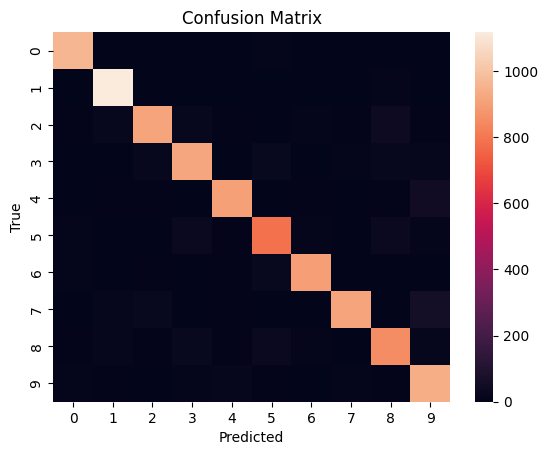

In [96]:
evaluator.plot_confusion()

#### d. CNN

In [9]:
class CNN(nn.Module):
    def __init__(self, hidden_dim, num_classes):
        super(CNN, self).__init__()

        self.hidden_dim = hidden_dim
        self.num_classes = num_classes
        # Architecture is inspired by LeNet-5
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=6, kernel_size=5, stride=1
                               , padding=0)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(in_channels=6, out_channels=16, kernel_size=5, stride=1,
                               padding=0)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.hidden = nn.Linear(16 * 4 * 4, self.hidden_dim)
        self.out = nn.Linear(self.hidden_dim, self.num_classes)

    def forward(self, x):
        x = self.conv1(x)
        x = self.pool1(x)
        x = self.conv2(x)
        x = self.pool2(x)
        x = x.view(x.size(0), -1)  # Flattening the input to the dense module
        h = self.hidden(x)
        pred = self.out(h)
        return pred

In [10]:
# Hyperparameters
hidden_dim = 128
num_classes = 10
cnn = CNN(hidden_dim, num_classes)
optimizer = optim.SGD(cnn.parameters(), lr=1e-2)
ce_loss = nn.CrossEntropyLoss()
epochs = 15

In [14]:
trainer = Trainer(train_loader, cnn, ce_loss, optimizer, epochs)
train_loss = trainer.train()

Epoch: 1 | Loss: 0.6411
Epoch: 2 | Loss: 0.2185
Epoch: 3 | Loss: 0.1537
Epoch: 4 | Loss: 0.1226
Epoch: 5 | Loss: 0.1045
Epoch: 6 | Loss: 0.0924
Epoch: 7 | Loss: 0.0839
Epoch: 8 | Loss: 0.0775
Epoch: 9 | Loss: 0.0724
Epoch: 10 | Loss: 0.0681
Epoch: 11 | Loss: 0.0645
Epoch: 12 | Loss: 0.0612
Epoch: 13 | Loss: 0.0584
Epoch: 14 | Loss: 0.0559
Epoch: 15 | Loss: 0.0536


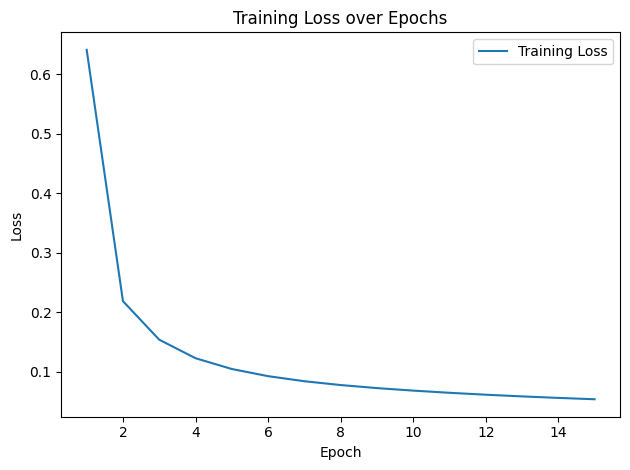

In [15]:
trainer.plot_loss(train_loss)

In [12]:
from sklearn.metrics import accuracy_score

In [16]:
evaluator = Evaluator(test_loader, cnn, ce_loss)
mean_acc, mean_loss = evaluator.evaluate()
print(f"The average test accuracy: {mean_acc}")
print(f"The average test loss: {mean_loss:.4f}")

The average test accuracy: 0.9815
The average test loss: 0.0582


In [18]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

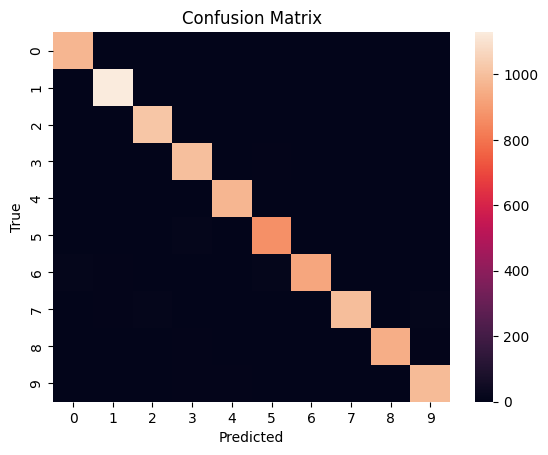

In [19]:
evaluator.plot_confusion()

### Disclosure

- www.stackoverflow.com
- Scikit-learn documentation
- Pytorch documentation
- http://vision.stanford.edu/cs598_spring07/papers/Lecun98.pdf